In [2]:
suppressMessages(suppressWarnings(library(Seurat)))
suppressMessages(suppressWarnings(library(stringr)))
suppressMessages(suppressWarnings(library(dplyr)))

# Load data

In [4]:
dataobj <- readRDS("/data1/chenyx/Compitition/Wang.rds")

In [5]:
dataobj

An object of class Seurat 
43878 features across 7231 samples within 1 assay 
Active assay: RNA (43878 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

# dimension reduction

PC_ 1 
Positive:  TTN, MYH7, ANKRD1, CMYA5, MYL3, MYL2, MYH6, MYL7, MYL4, SLN 
	   MAP3K20-AS1, ZBED6CL, LINGO4, DBH-AS1, C1QTNF3, ZNF572, DBIL5P, PLCL2-AS1, PCDHGB2, TMC3 
	   HCG17, FAM224B, SMIM18, MAST4-IT1, HROB, LINC01126, PGAM1P12, ERICD, GVQW1, SLAMF1 
Negative:  B2M, IFITM3, TMSB4X, SPARCL1, MALAT1, TMSB10, HLA-E, HLA-B, VIM, IFITM2 
	   IFI27, H3-3B, CD74, ANXA2, PTMA, MGP, PECAM1, GSN, TM4SF1, GNG11 
	   ID3, MYL6, ENG, TACC1, S100A11, VWF, AQP1, S100A10, HLA-A, GIMAP7 
PC_ 2 
Positive:  DCN, SERPINF1, MFAP5, C1R, PTN, LUM, CFD, ADH1B, PRELP, FBLN1 
	   ABI3BP, MGST1, CCDC80, COL1A2, VCAN, ABCA8, SCARA5, TIMP1, DPT, SCN7A 
	   COL14A1, NUPR1, C3, SERPING1, PLA2G2A, MGP, PLAC9, APOD, CFH, IGFBP6 
Negative:  VWF, CD74, AQP1, F8, HLA-DRB1, FLT1, GIMAP7, PECAM1, HLA-B, FABP5P7 
	   ITGA6, BTNL9, RAMP3, CLDN5, PTPRB, SHANK3, ADGRF5, ADGRL4, CDH5, HLA-E 
	   CD93, EMCN, WARS1, H19, CAV1, HLA-DRA, CLEC14A, ID1, MYL2, CA4 
PC_ 3 
Positive:  MS4A6A, AIF1, CD163, TYROBP, FCER1G, LAPTM

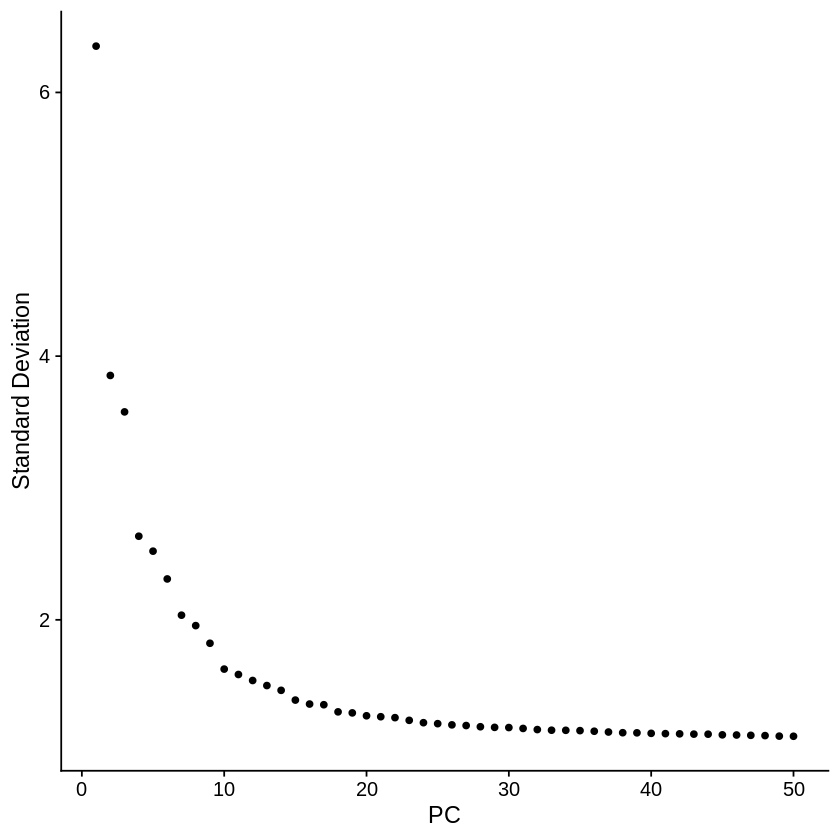

In [6]:
dataobj <- RunPCA(dataobj, features = VariableFeatures(object = dataobj))
ElbowPlot(dataobj,ndims=50) 

In [7]:
pcDim = 20

In [ ]:
dataobj <- RunUMAP(dataobj, dims = 1:pcDim)
p_umap <- DimPlot(dataobj, reduction = "umap", label = TRUE, pt.size=1)

# Clustering

In [13]:
# Cluster the cells
dataobj <- FindNeighbors(dataobj, reduction = "pca", dims = 1:pcDim, nn.eps = 0.5)
dataobj <- FindClusters(dataobj, resolution = 0.8, n.start = 10)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7231
Number of edges: 307502

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8744
Number of communities: 20
Elapsed time: 0 seconds


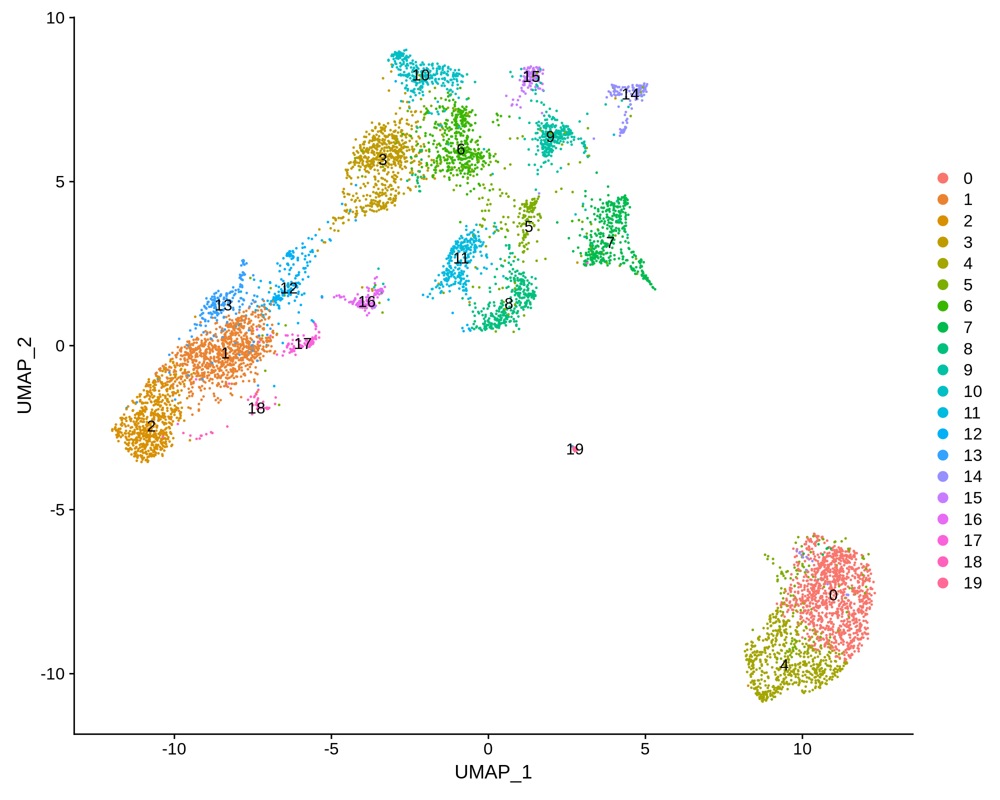

In [15]:
options(repr.plot.width=10, repr.plot.height=8, repr.plot.res = 200)
DimPlot(dataobj,reduction = "umap",label = T)

# Annoation

### Fibroblast

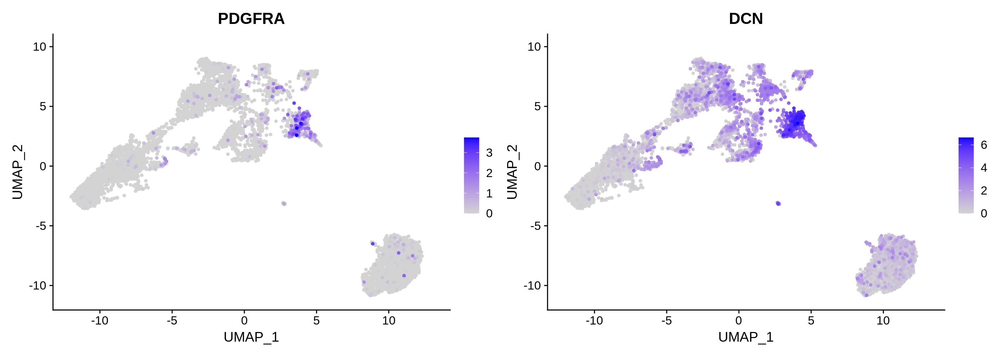

In [16]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1
FeaturePlot(dataobj,features = c("PDGFRA","DCN"),pt.size = pt.size,order = T,ncol=2)

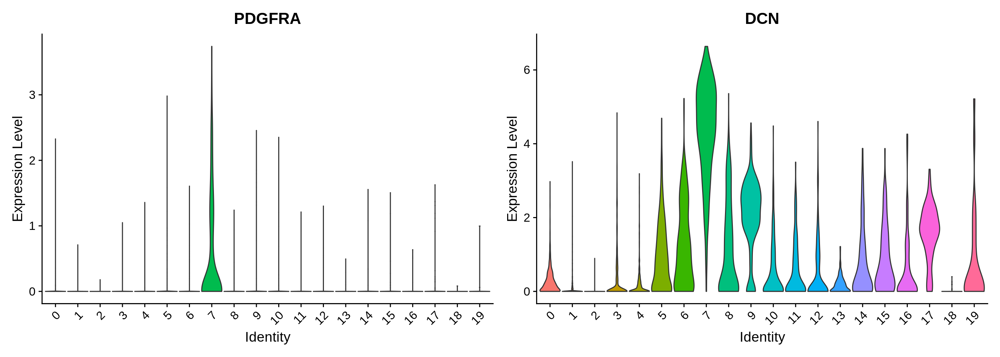

In [17]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

VlnPlot(dataobj,features = c("PDGFRA","DCN"),pt.size = 0,ncol=2)

In [18]:
dataobj <- RenameIdents(object = dataobj,'7' = 'Fibroblast')

### Cardiomyocyte cell

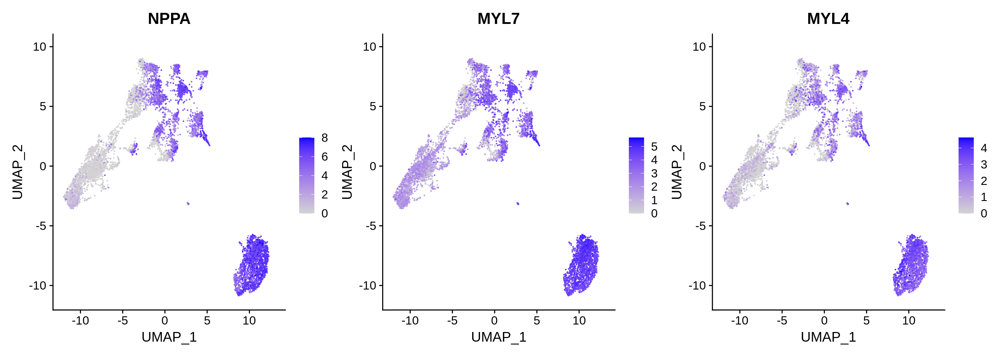

In [19]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

FeaturePlot(dataobj,features = c("NPPA","MYL7","MYL4"),pt.size = 0.1,order = T,ncol=3)

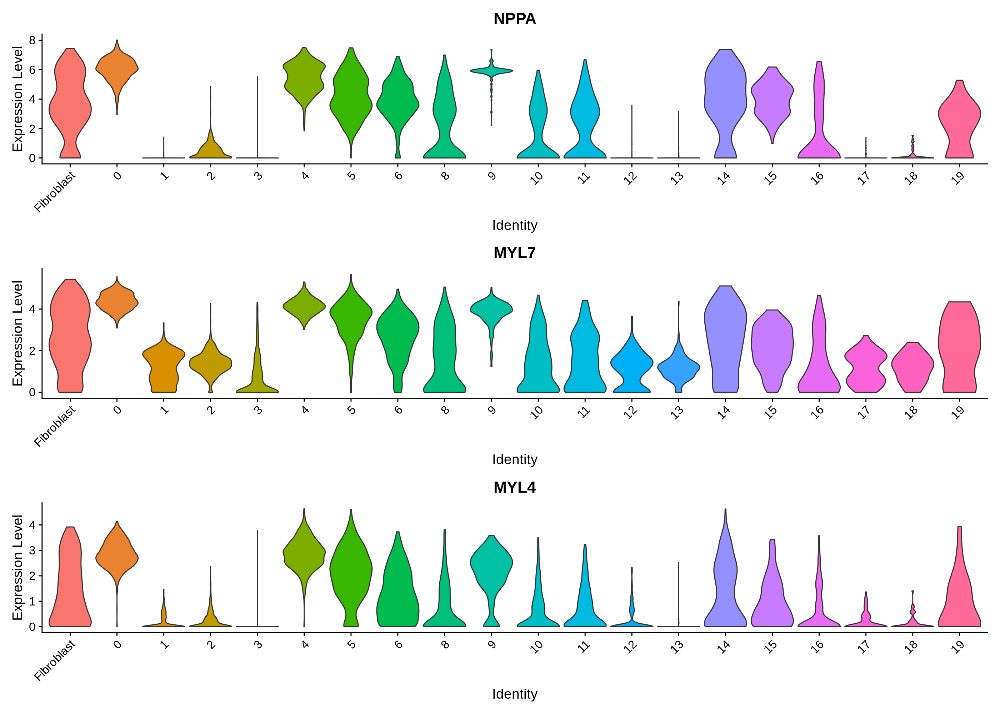

In [20]:
options(repr.plot.width=14, repr.plot.height=10, repr.plot.res = 200)

VlnPlot(dataobj,features = c("NPPA","MYL7","MYL4"),pt.size = 0,ncol=1)

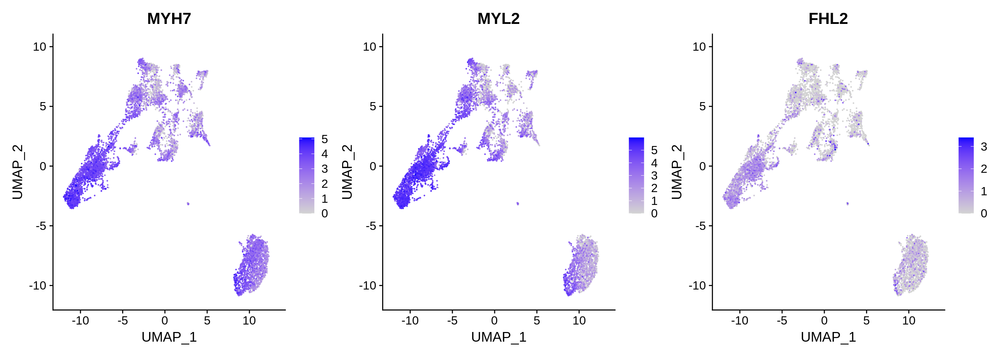

In [21]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

FeaturePlot(dataobj,features = c("MYH7","MYL2","FHL2"),pt.size = 0.1,order = T,ncol=3)

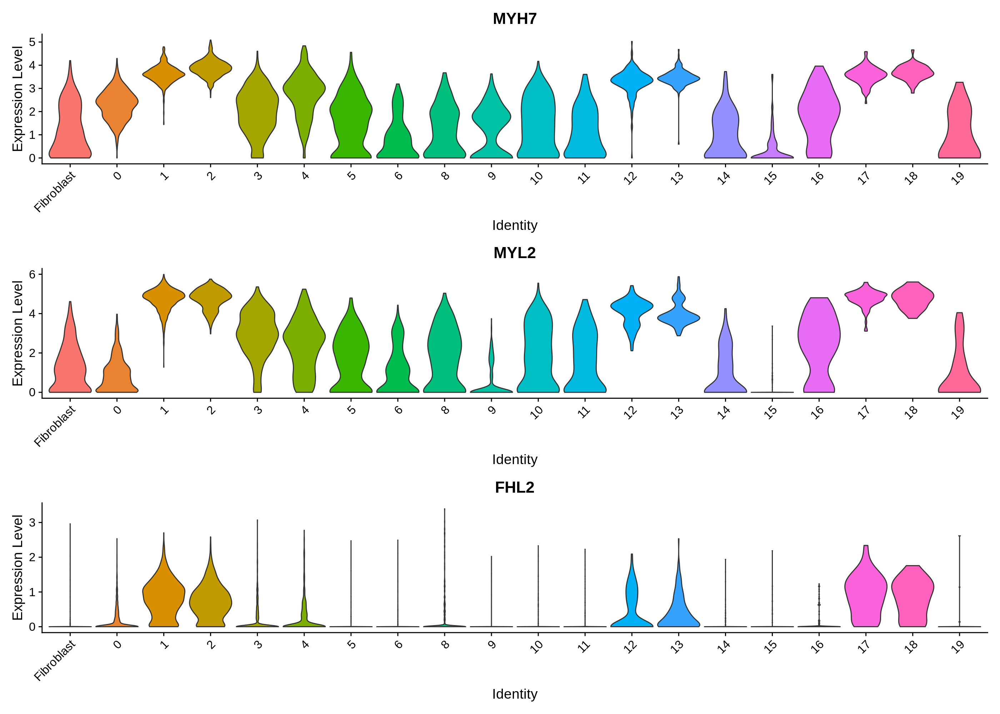

In [22]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MYH7","MYL2","FHL2"),pt.size = 0,ncol=1)

In [23]:
dataobj <- RenameIdents(object = dataobj,'0' = 'Cardiomyocyte cell', '4' = 'Cardiomyocyte cell','1' = 'Cardiomyocyte cell','2' = 'Cardiomyocyte cell','18' = 'Cardiomyocyte cell','17' = 'Cardiomyocyte cell','13' = 'Cardiomyocyte cell')

### SMC

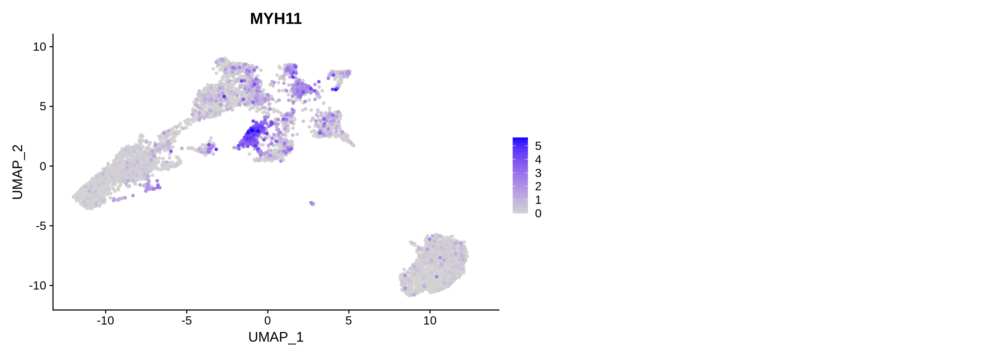

In [24]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("MYH11"),pt.size = pt.size,order = T,ncol=2)

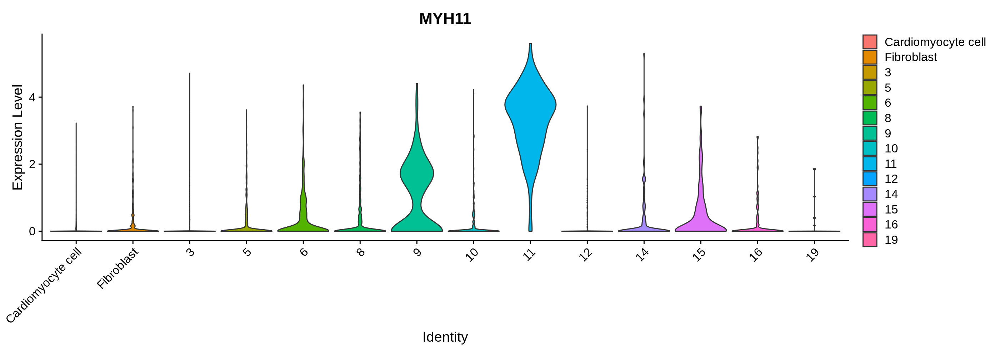

In [25]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MYH11"),pt.size = 0,ncol=1)

In [26]:
dataobj <- RenameIdents(object = dataobj,'11' = 'Smooth muscle cell')

### Pericyte

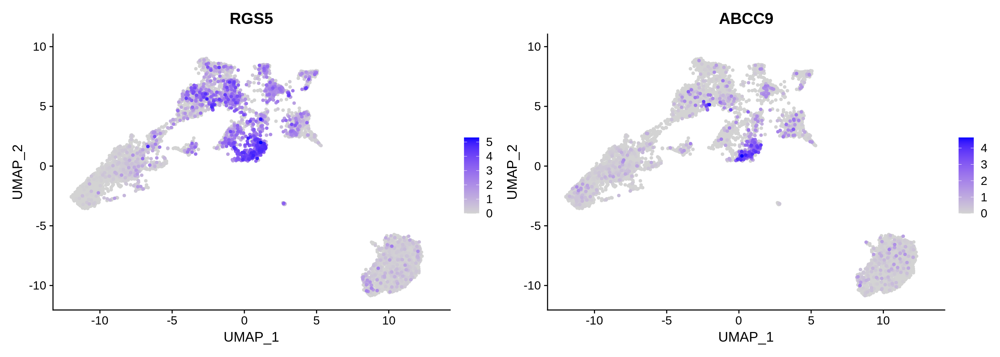

In [27]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("RGS5","ABCC9"),pt.size = pt.size,order = T,ncol=2)

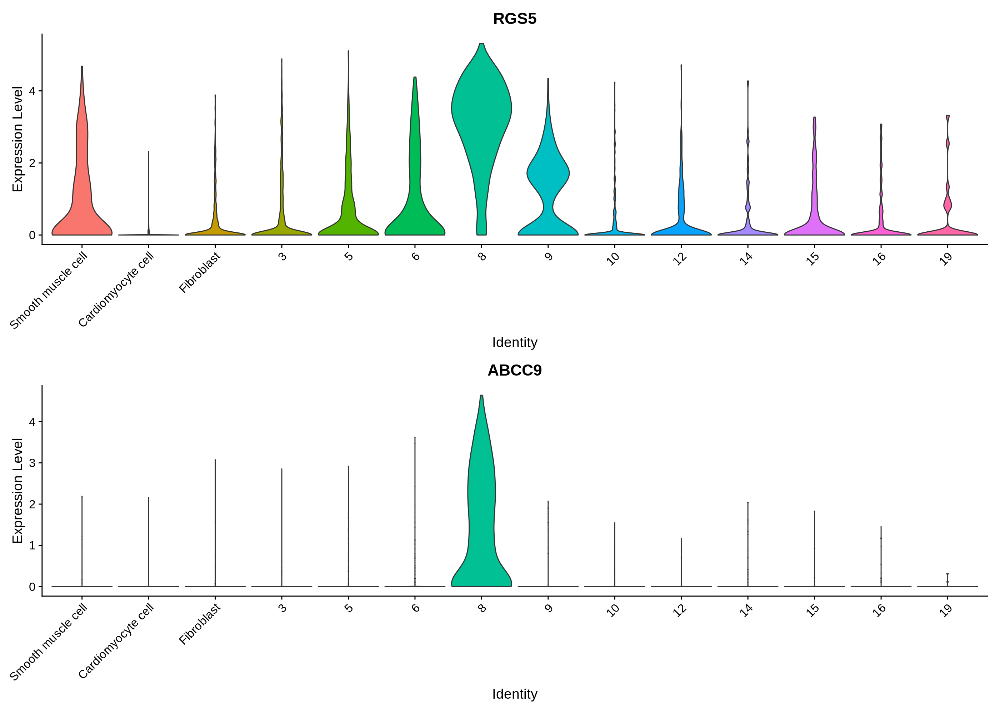

In [28]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("RGS5","ABCC9"),pt.size = 0,ncol=1)

In [29]:
dataobj <- RenameIdents(object = dataobj,'8' = 'Pericyte')

### Mesothelial cell

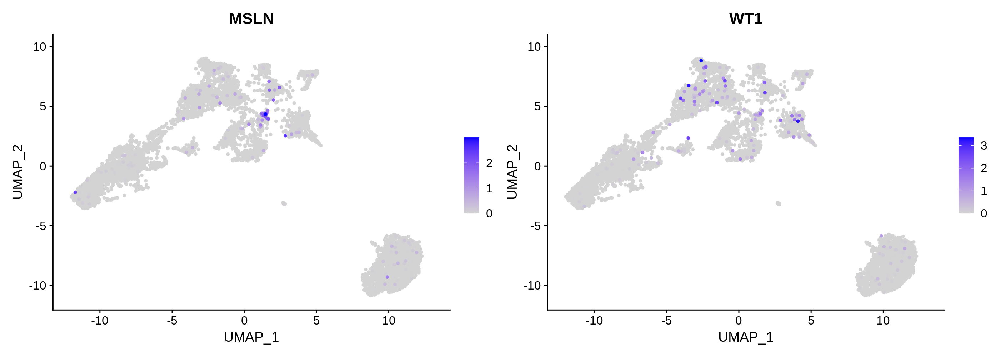

In [30]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("MSLN","WT1"),pt.size = pt.size,order = T,ncol=2)

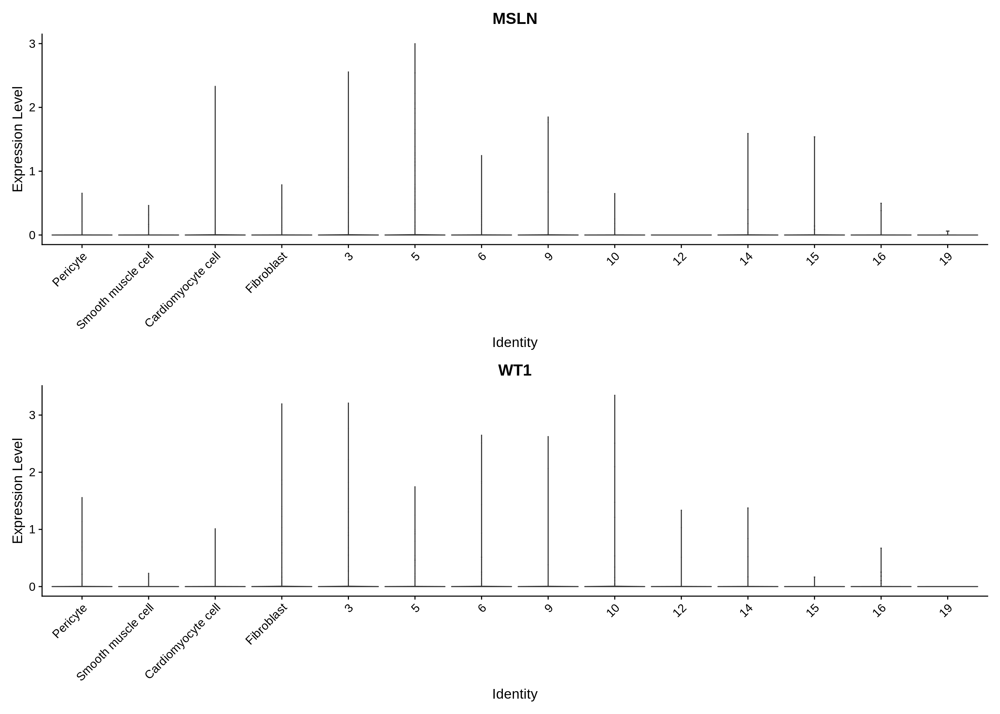

In [31]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MSLN","WT1"),pt.size = 0,ncol=1)

In [48]:
dataobj <- RenameIdents(object = dataobj,'5' = 'Mesothelial cell')

### Endothelial cell

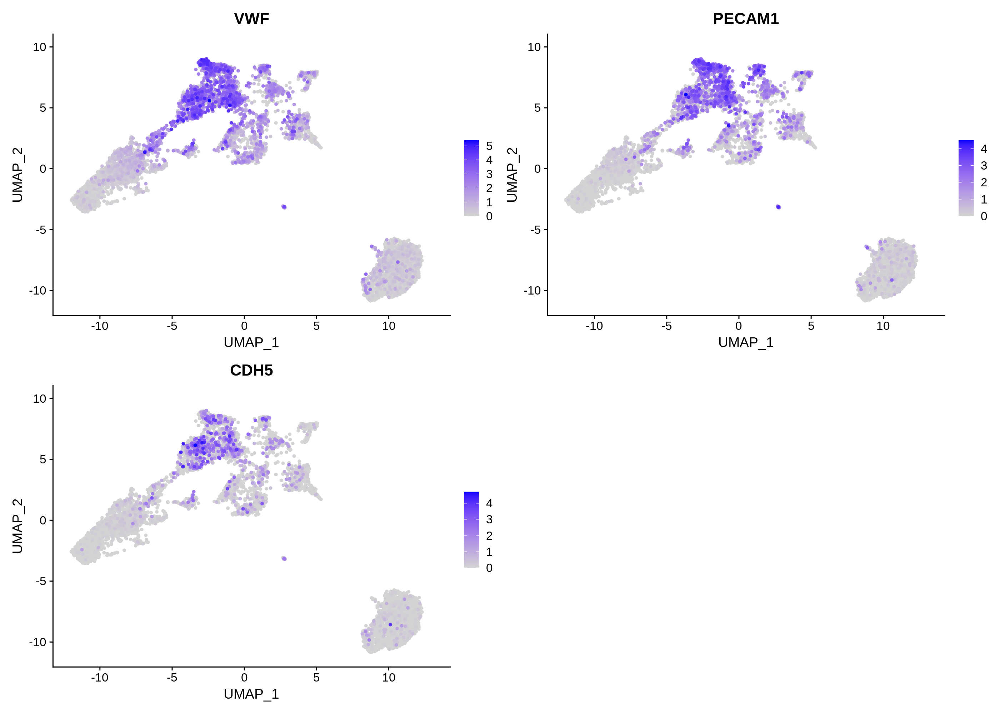

In [32]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("VWF","PECAM1","CDH5"),pt.size = pt.size,order = T,ncol=2)

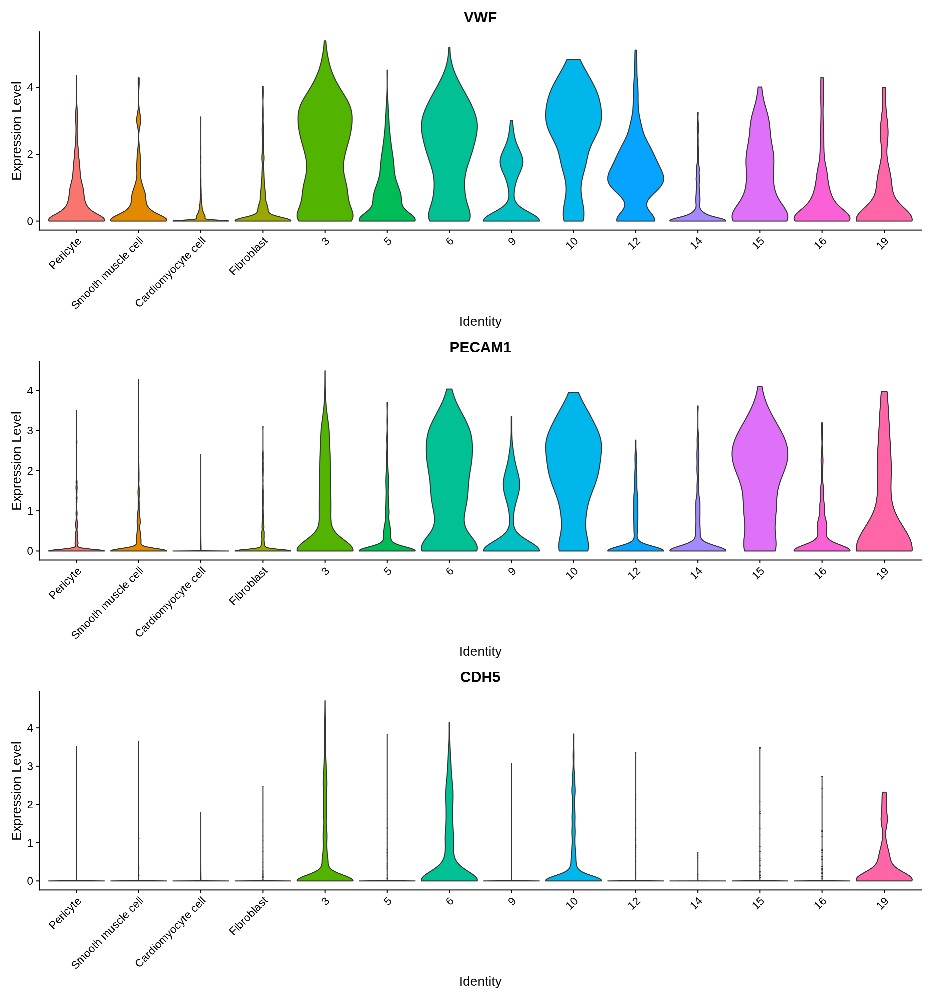

In [33]:
options(repr.plot.width=14, repr.plot.height=5*3, repr.plot.res = 200)

VlnPlot(dataobj,features = c("VWF","PECAM1","CDH5"),pt.size = 0,ncol=1)

In [47]:
dataobj <- RenameIdents(object = dataobj,'3' = 'Endothelial cell','6' = 'Endothelial cell','10' = 'Endothelial cell','12' = 'Endothelial cell','19' = 'Endothelial cell','15' = 'Endothelial cell','9' = 'Endothelial cell')

Warning message:
“Cannot find identity 19”
Warning message:
“Cannot find identity 12”
Warning message:
“Cannot find identity 10”
Warning message:
“Cannot find identity 6”
Warning message:
“Cannot find identity 3”


### Neuron

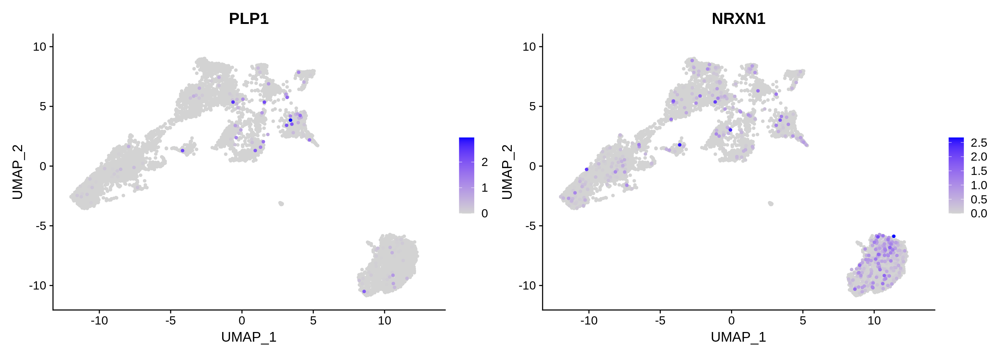

In [35]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("PLP1","NRXN1"),pt.size = pt.size,order = T,ncol=2)

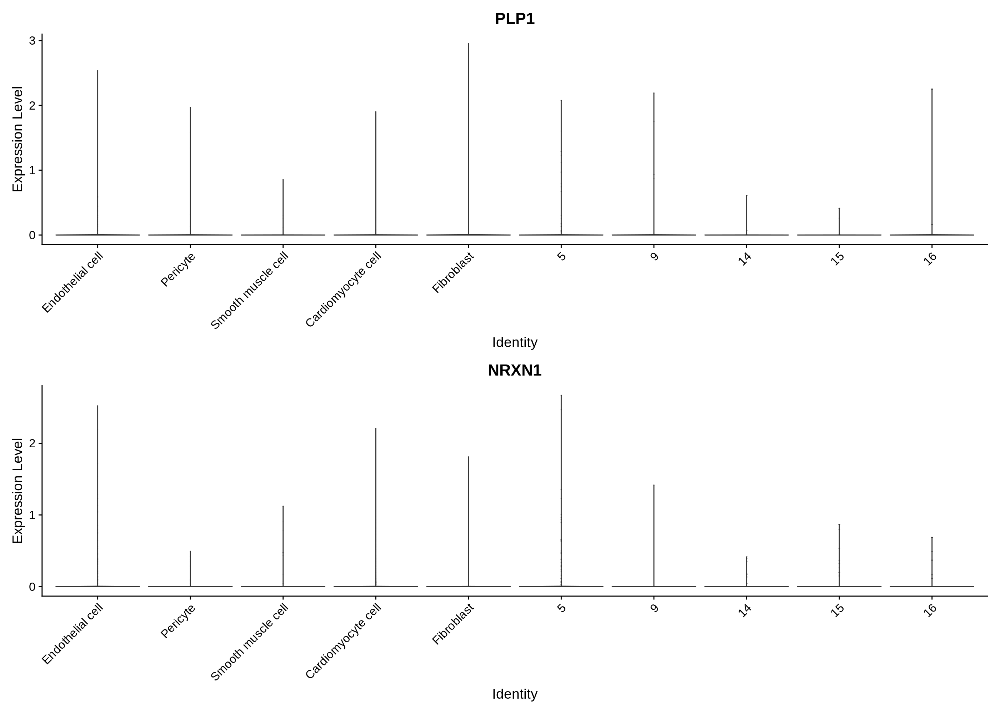

In [36]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("PLP1","NRXN1"),pt.size = 0,ncol=1)

### Neurglial cell

Warning message in FeaturePlot(dataobj, features = c("MBP", "PRX", "MPZ"), pt.size = pt.size, :
“All cells have the same value (0) of MBP.”
Warning message in FeaturePlot(dataobj, features = c("MBP", "PRX", "MPZ"), pt.size = pt.size, :
“All cells have the same value (0) of PRX.”


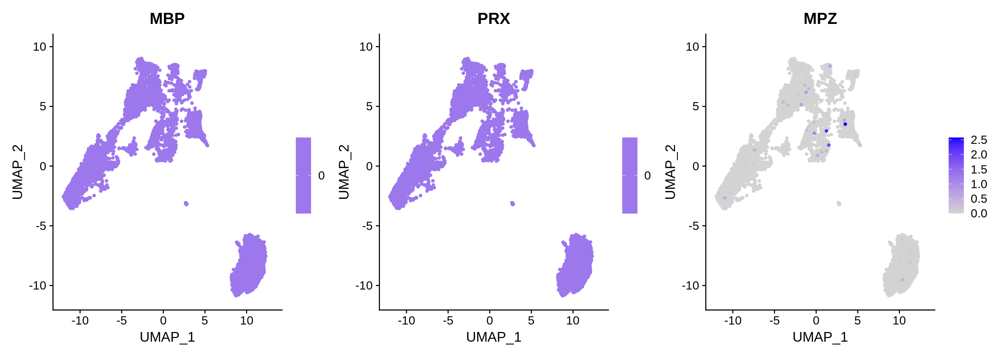

In [37]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("MBP","PRX","MPZ"),pt.size = pt.size,order = T,ncol=3)

Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of MBP.”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of PRX.”


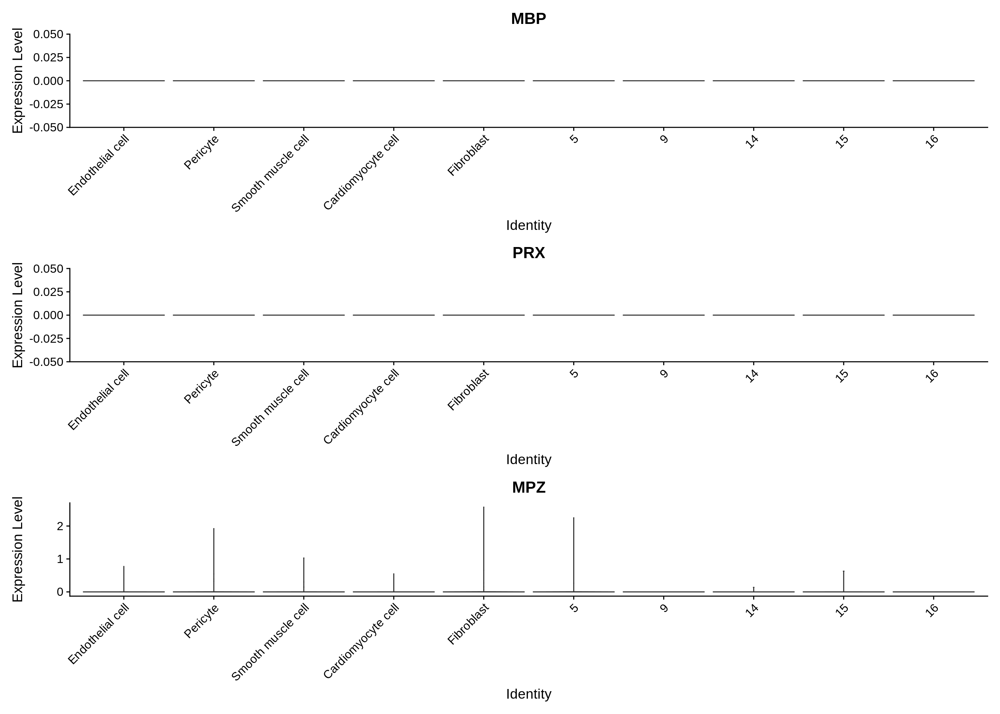

In [38]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("MBP","PRX","MPZ"),pt.size = 0,ncol=1)

### Adipocyte

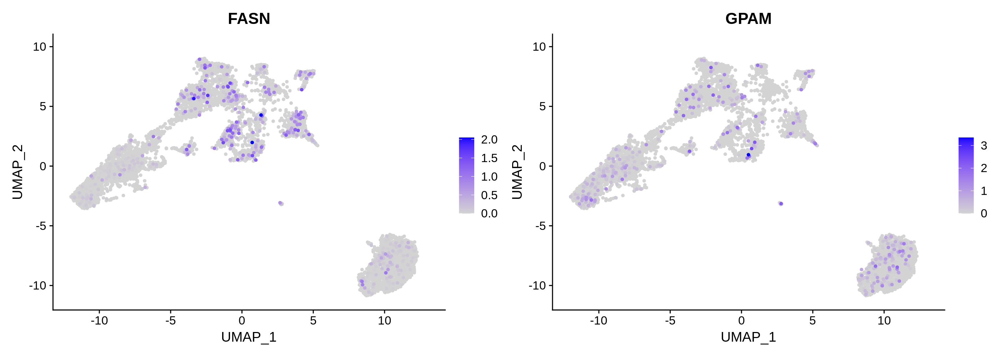

In [39]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("FASN","GPAM"),pt.size = pt.size,order = T,ncol=2)

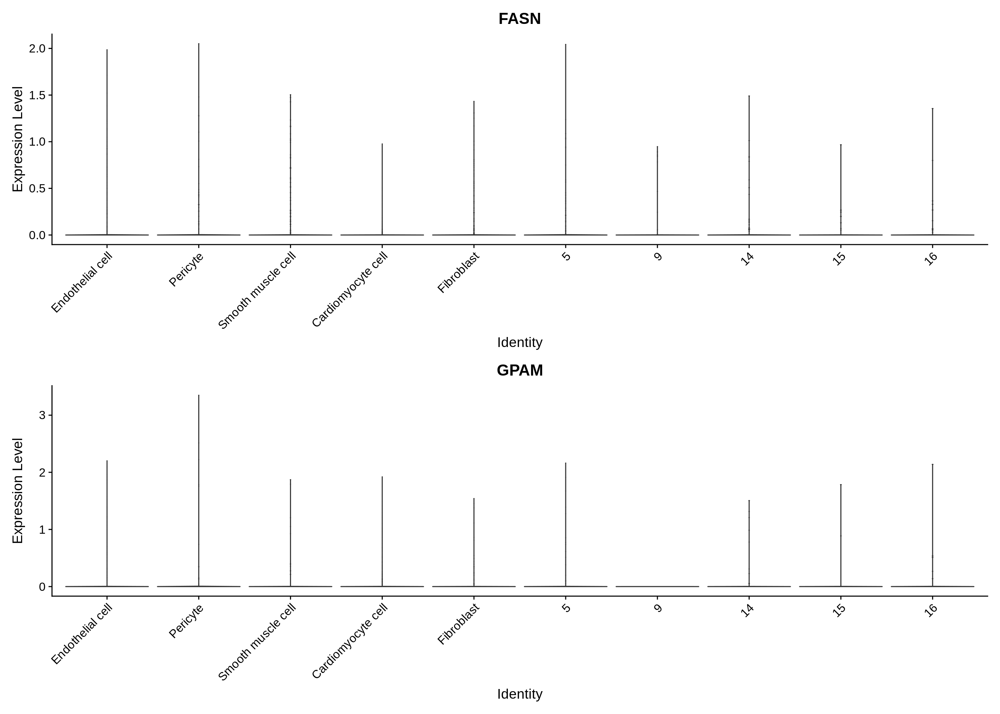

In [40]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("FASN","GPAM"),pt.size = 0,ncol=1)

### Myeloid cell

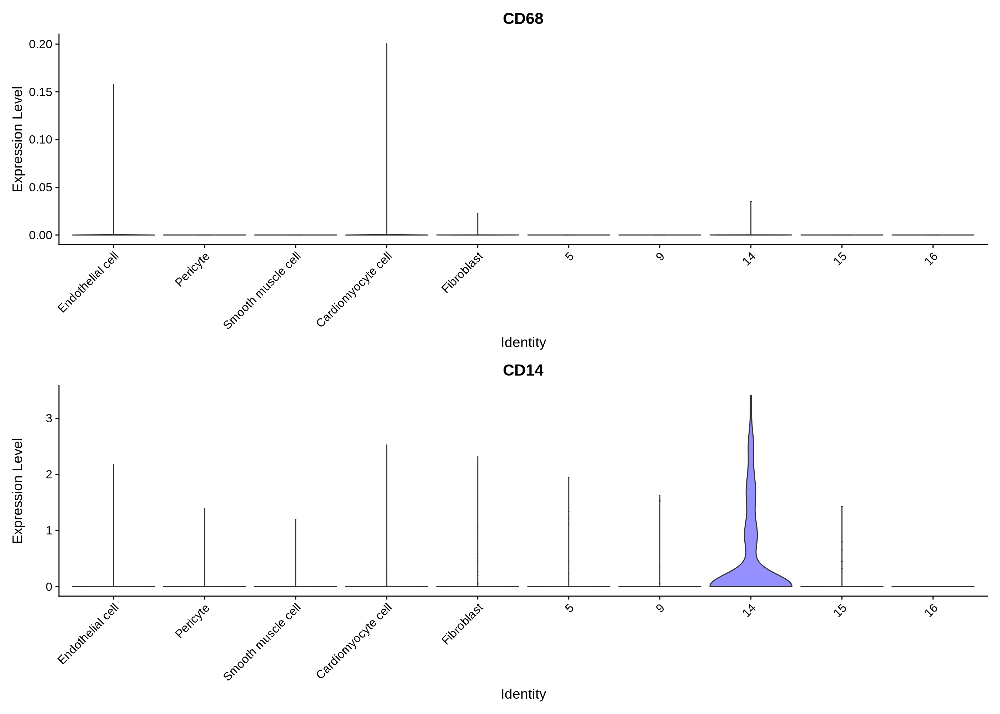

In [41]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("CD68","CD14"),pt.size = 0,ncol=1)

In [42]:
dataobj <- RenameIdents(object = dataobj,'14' = 'Myeloid cell')

### Lymphoid cell

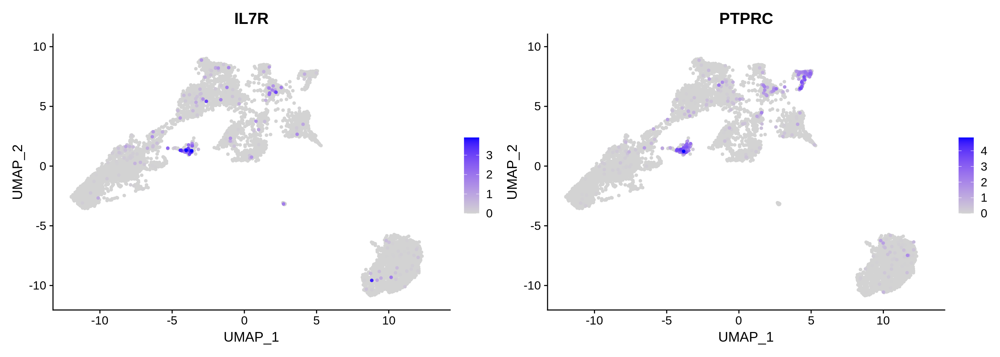

In [43]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(dataobj,features = c("IL7R","PTPRC"),pt.size = pt.size,order = T,ncol=2)

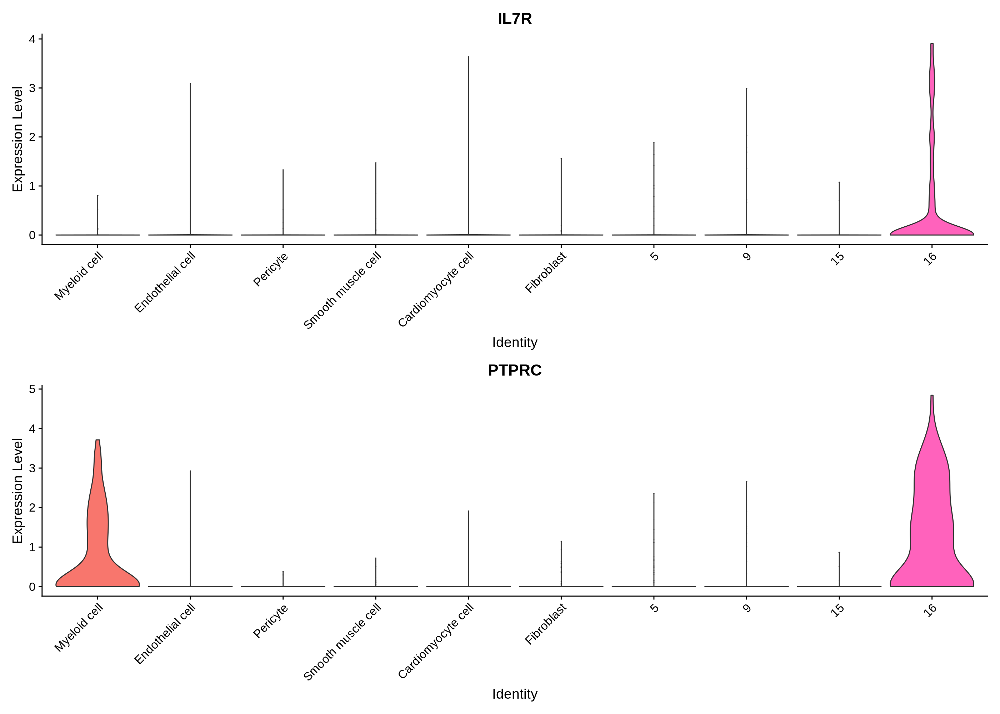

In [44]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(dataobj,features = c("IL7R","PTPRC"),pt.size = 0,ncol=1)

In [45]:
dataobj <- RenameIdents(object = dataobj,'16' = 'Lymphoid cell')

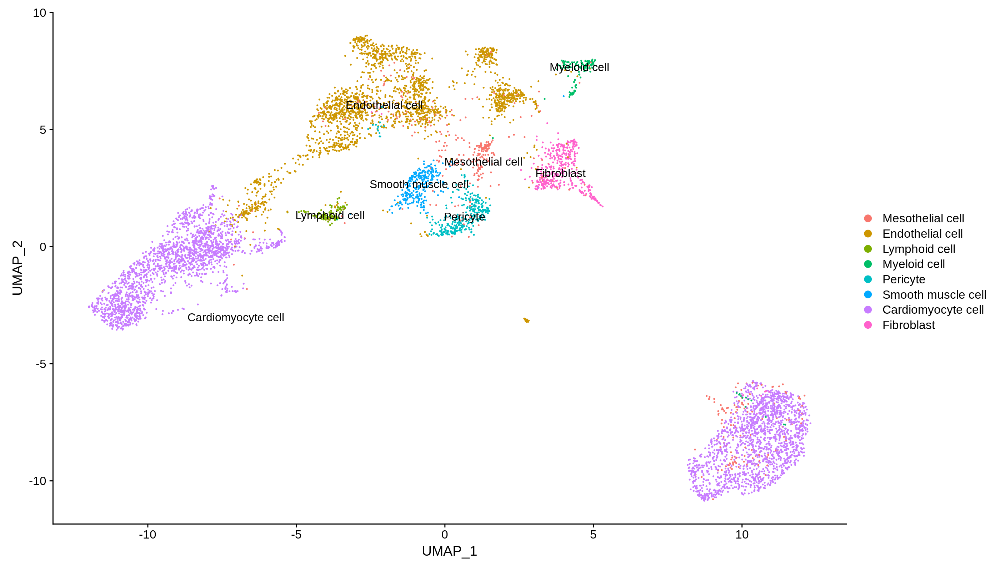

In [49]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(dataobj,reduction = "umap",label = T)

In [50]:
dataobj$cell_type <- as.character(Idents(dataobj))

# Sub.celltype Annotation

### Reannotate Endothelial cell

In [51]:
subobj <- subset(dataobj,cell_type =="Endothelial cell")

In [52]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1098 features requested have not been scaled (running reduction without them): LDAH, PRDM8, PDIK1L, TDRKH, CEBPB-AS1, KPTN, MIR545, PHF24, DEPDC7, SLC26A8, RLN2, VPREB3, TMEM86A, RFX8, PINK1, RAB3IL1, DDX10P1, C1orf74, INCENP, ZFPL1, BVES-AS1, TRIM14, CCDC39, ADAM20, TMLHE-AS1, ZSWIM3, IFNG-AS1, SNORA59A, TPTE2P1, PSD, IL17REL, FAM166A, ZDHHC1, NUDT17, SPESP1, GOLGA7B, SYN3, ZNF229, TAF5, KRT18P4, RGS17, RBM44, PIH1D2, ST7-OT4, SHC4, KCNQ3, UBXN10, AP1M2, KRT8P45, LINC01494, RGS9, PRRT3-AS1, WIF1, ARHGAP5-AS1, TAF1A-AS1, DEPDC1, MTND5P25, FAM185BP, FAM219B, CFAP58, FAAH2, ZNF582, MUSK, MUC20, CETN4P, ITGB3, ELMOD1, TMEM187, TIGD1, MYLK4, ACTA2-AS1, HSPD1P11, FAM71F2, C6orf47, ZBED9, ZNF596, BMPR1B-DT, SNORD99, DDX28, LINC01538, GHRH, ZNF18, C16orf46, KATNAL2, YY2, PRH1, NAP1L3, MGAT5B, RHOT1P3, DPPA2P4, CTAGE15, MSS51, MTCO1P5, MIEF2, RALGPS2, RHOQP1, ZNF30-AS1, SUV39H2, SLC6A13, RND2, GR

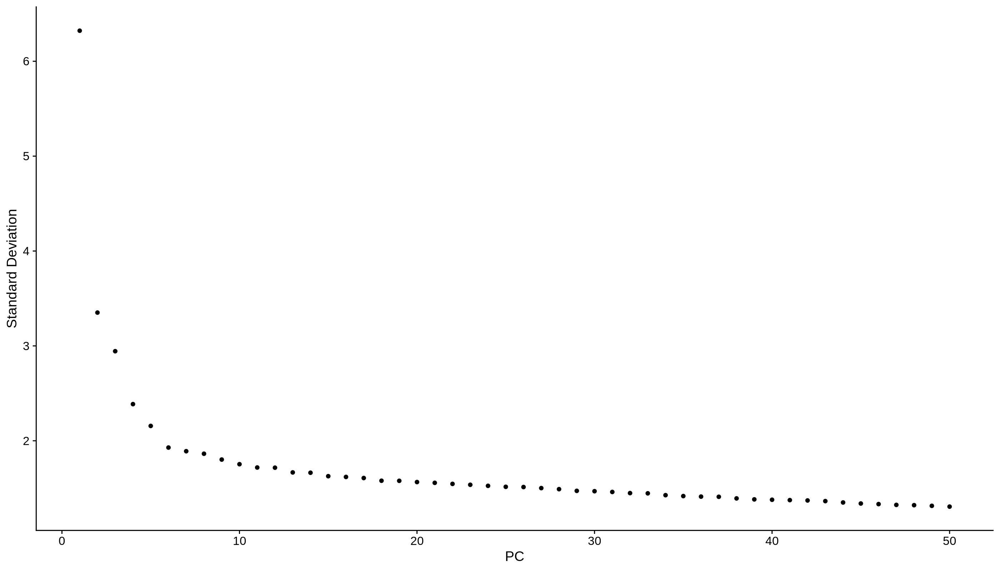

In [53]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))
ElbowPlot(subobj,ndims=50) 

In [54]:
pcDim = 15

In [55]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

18:31:29 UMAP embedding parameters a = 0.9922 b = 1.112

18:31:29 Read 1999 rows and found 15 numeric columns

18:31:29 Using Annoy for neighbor search, n_neighbors = 30

18:31:29 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

18:31:29 Writing NN index file to temp file /tmp/RtmpgFw1Vx/file3eca57127ea369

18:31:29 Searching Annoy index using 1 thread, search_k = 3000

18:31:30 Annoy recall = 100%

18:31:30 Commencing smooth kNN distance calibration using 1 thread

18:31:31 Initializing from normalized Laplacian + noise

18:31:31 Commencing optimization for 500 epochs, with 80732 positive edges

18:31:33 Optimization finished



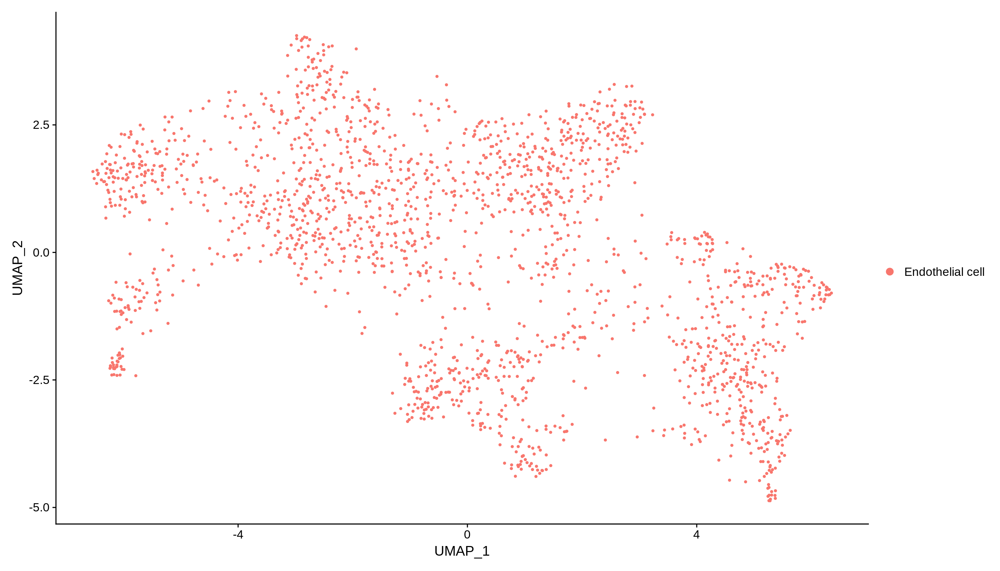

In [56]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj, reduction = "umap")

In [77]:
# Cluster the cells
subobj <- FindNeighbors(subobj, reduction = "pca", dims = 1:pcDim, nn.eps = 0.5)
subobj <- FindClusters(subobj, resolution = 0.4, n.start = 4)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1999
Number of edges: 77987

Running Louvain algorithm...
Maximum modularity in 4 random starts: 0.8618
Number of communities: 7
Elapsed time: 0 seconds


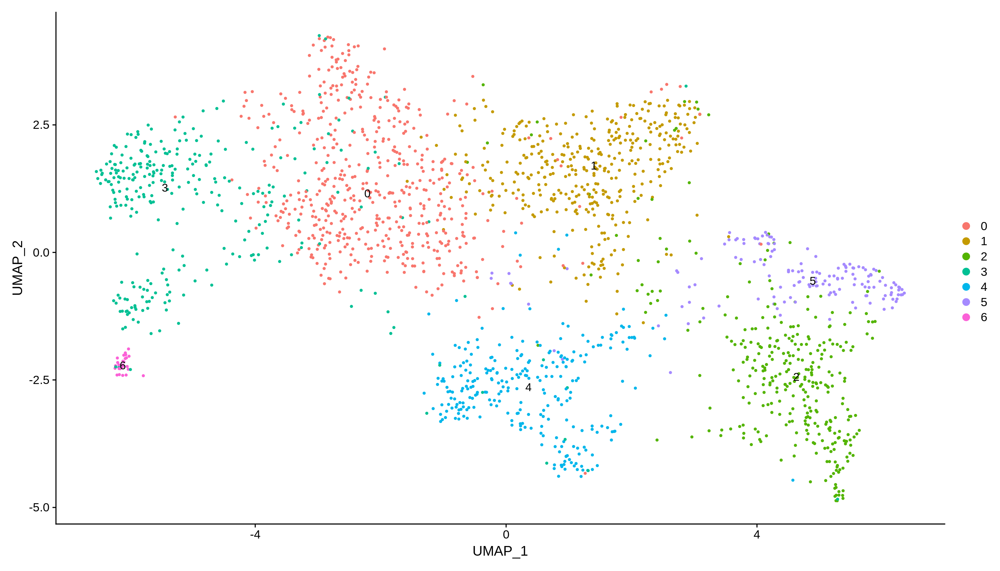

In [78]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj,reduction = "umap",label = T)

#### Vascular endothelial cell

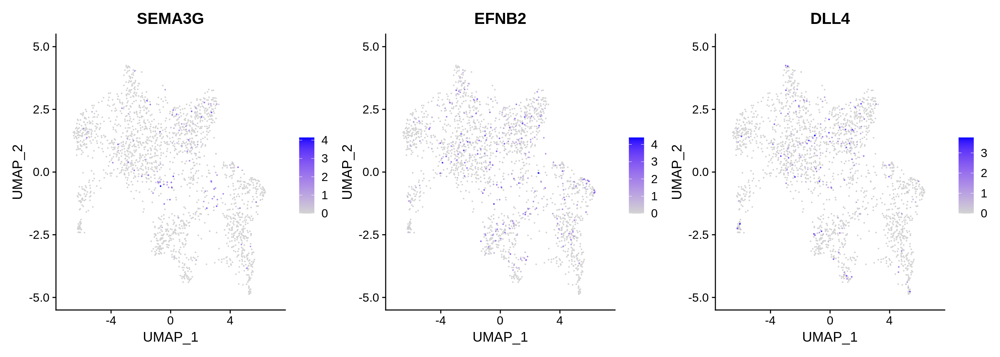

In [59]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=0.1

FeaturePlot(subobj,features = c("SEMA3G","EFNB2","DLL4"),pt.size = pt.size,order = T,ncol=3)

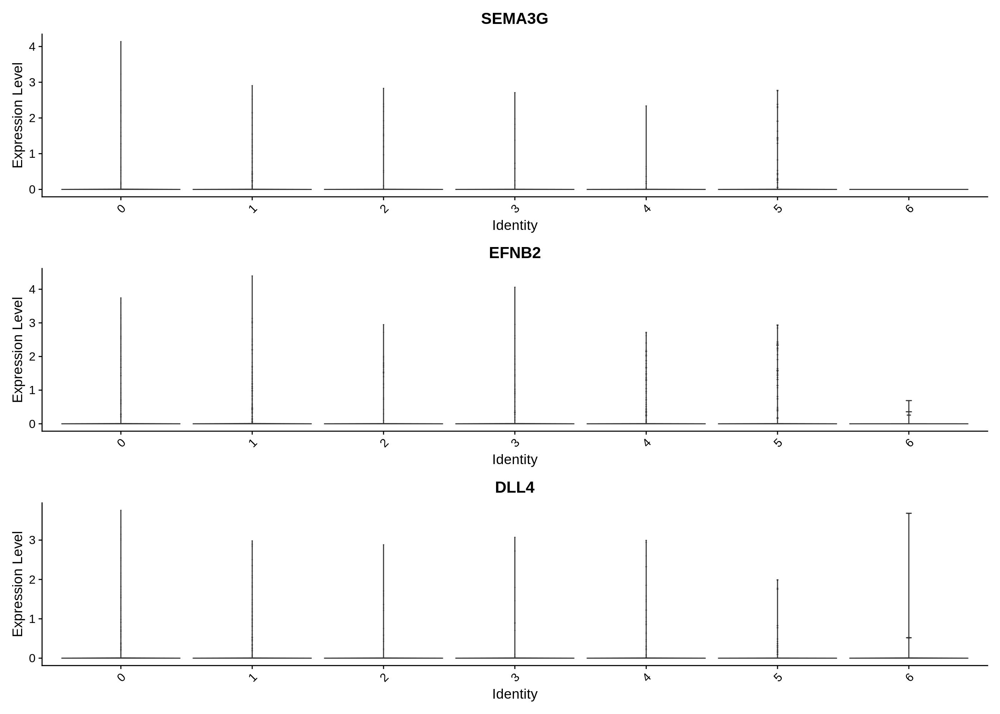

In [60]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(subobj,features = c("SEMA3G","EFNB2","DLL4"),pt.size = 0,ncol=1)

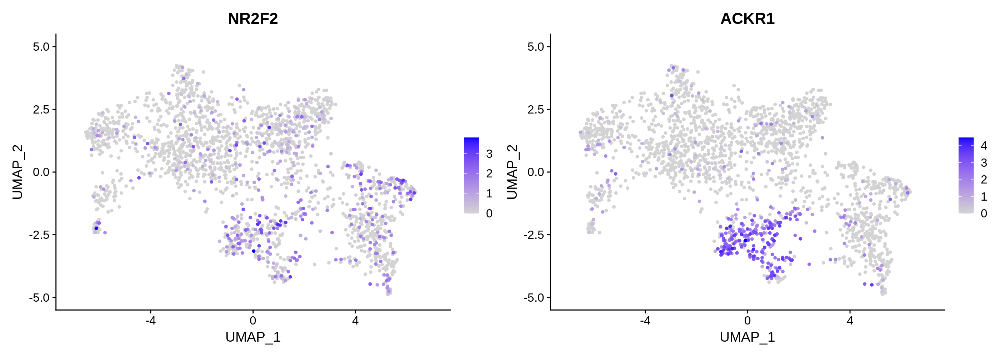

In [61]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("NR2F2","ACKR1"),pt.size = pt.size,order = T,ncol=2)

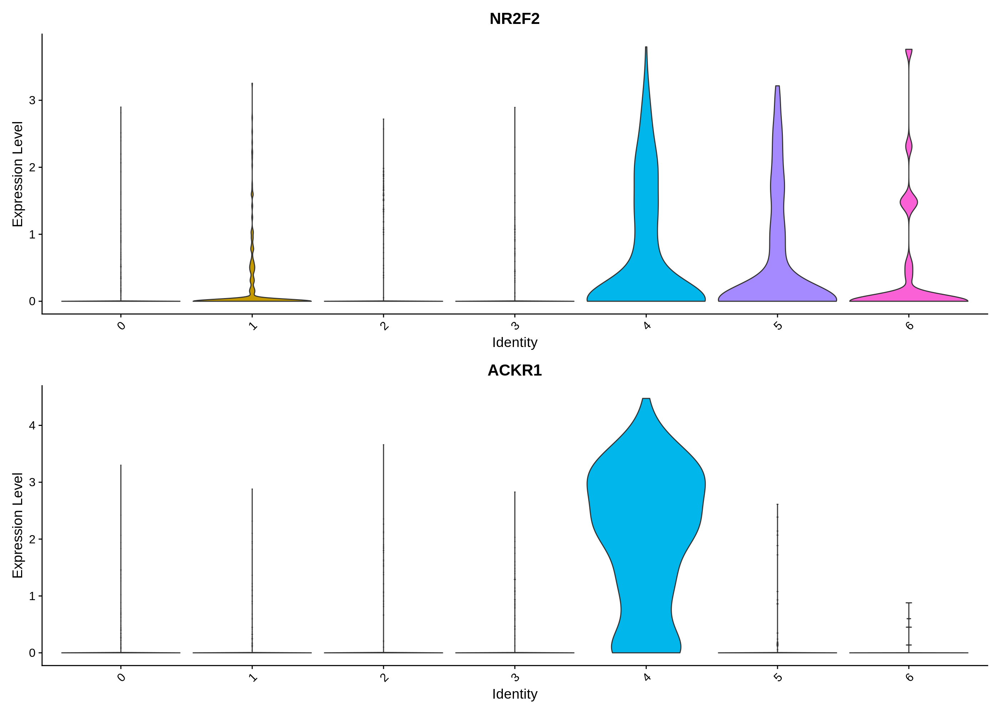

In [62]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(subobj,features = c("NR2F2","ACKR1"),pt.size = 0,ncol=1)

In [79]:
subobj <- RenameIdents(object = subobj,'4' = 'Vascular endothelial cell','5' = 'Vascular endothelial cell')

#### Endocardial cell

Warning message in FeaturePlot(subobj, features = c("NPR3"), pt.size = pt.size, :
“All cells have the same value (0) of NPR3.”


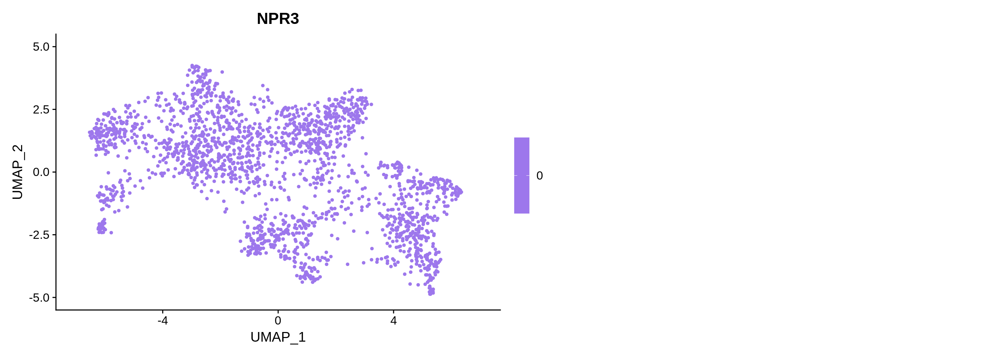

In [80]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("NPR3"),pt.size = pt.size,order = T,ncol=2)

Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of NPR3.”


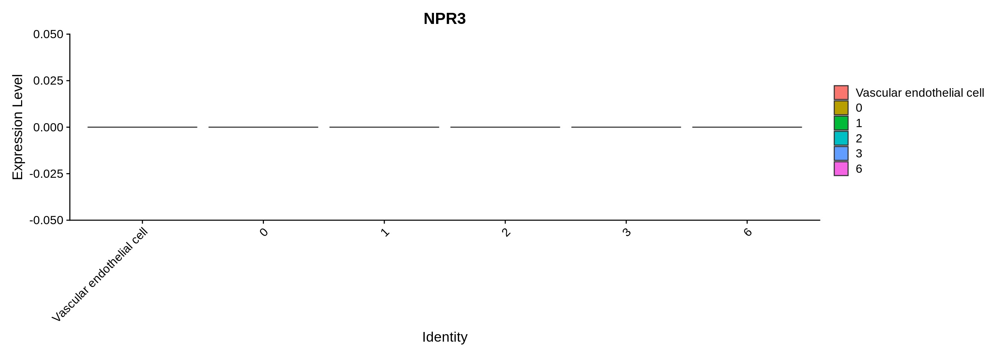

In [81]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)

VlnPlot(subobj,features = c("NPR3"),pt.size = 0,ncol=1)

#### Lymphatic endothelial cell

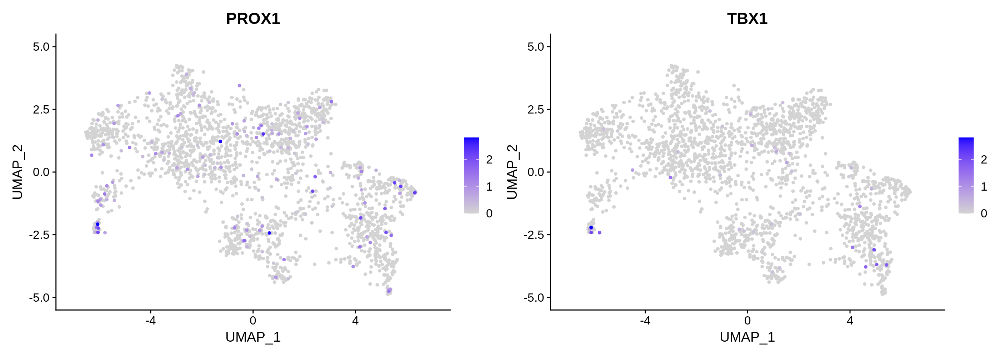

In [82]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("PROX1","TBX1"),pt.size = pt.size,order = T,ncol=2)

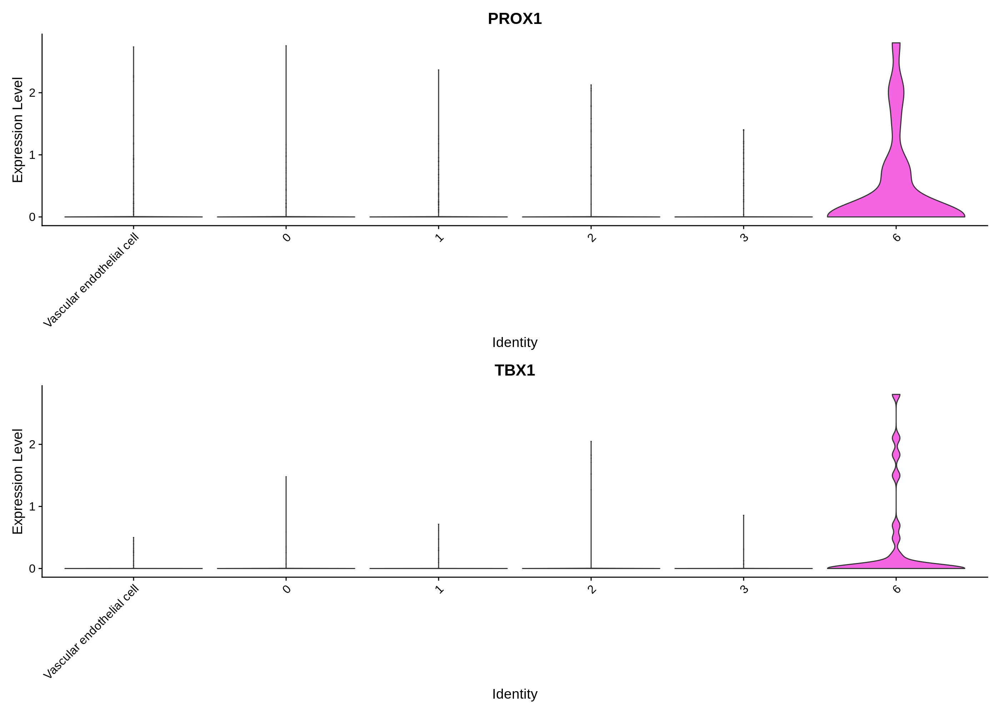

In [83]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)

VlnPlot(subobj,features = c("PROX1","TBX1"),pt.size = 0,ncol=1)

In [84]:
subobj <- RenameIdents(object = subobj,'6' = 'Lymphatic endothelial cell')

#### Capillary endothelial cell

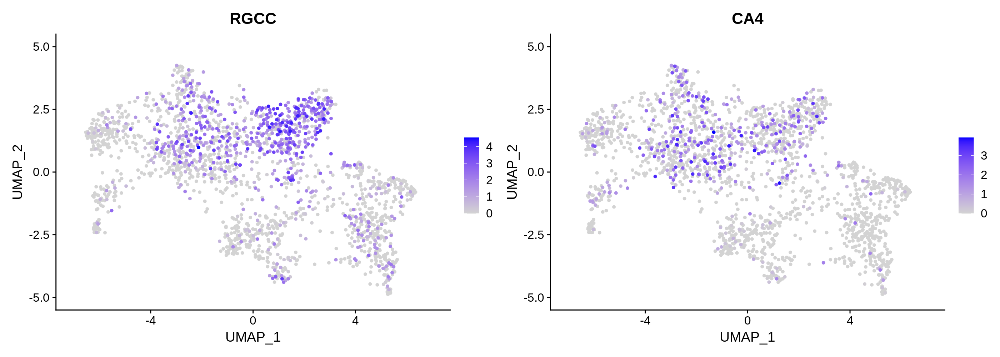

In [85]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("RGCC","CA4"),pt.size = pt.size,order = T,ncol=2)

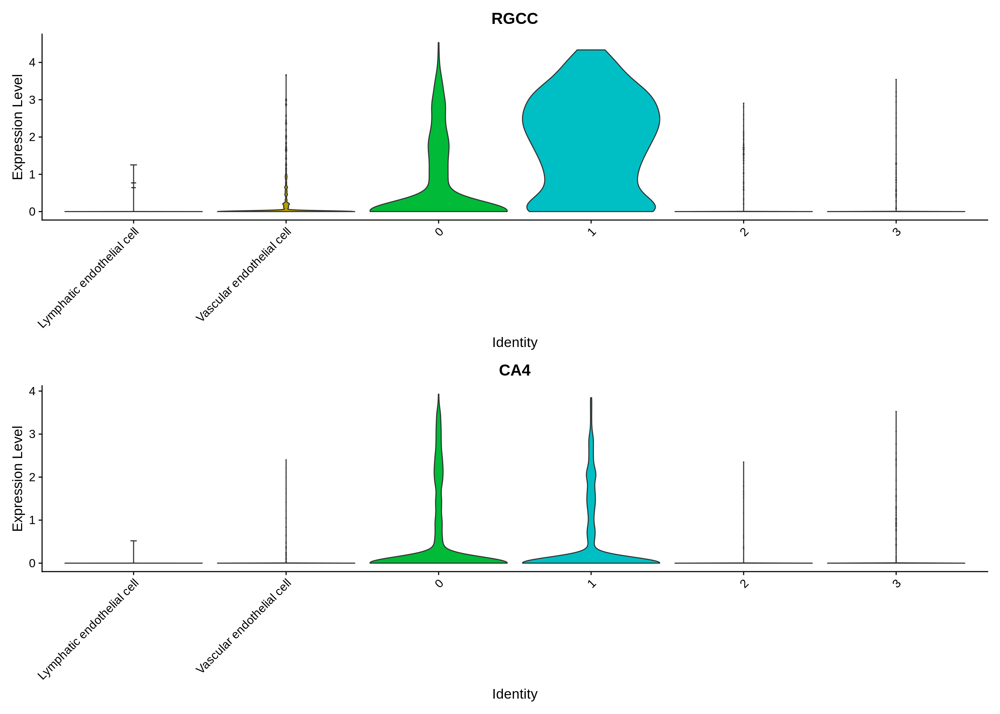

In [86]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
VlnPlot(subobj,features = c("RGCC","CA4"),pt.size = 0,ncol=1)

In [87]:
subobj <- RenameIdents(object = subobj,'0' = 'Capillary endothelial cell','1' = 'Capillary endothelial cell')

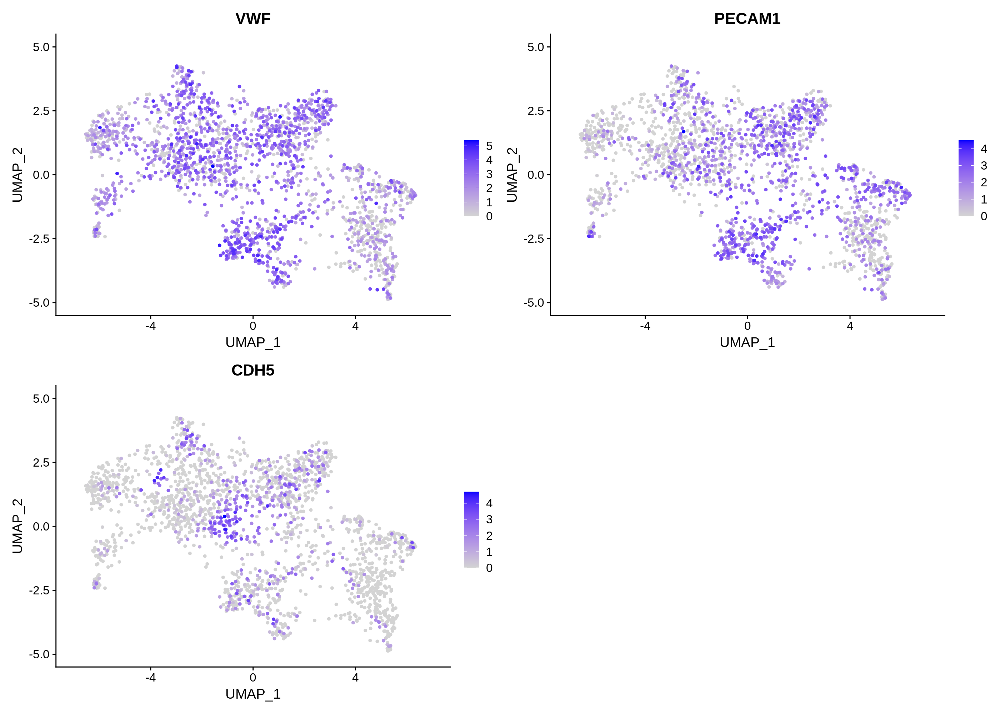

In [88]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
pt.size=1


FeaturePlot(subobj,features = c("VWF","PECAM1","CDH5"),pt.size = pt.size,order = T,ncol=2)

In [89]:
subobj <- RenameIdents(object = subobj,'2' = 'Endothelial cell','3' = 'Endothelial cell','5' = 'Endothelial cell')

Warning message:
“Cannot find identity 5”


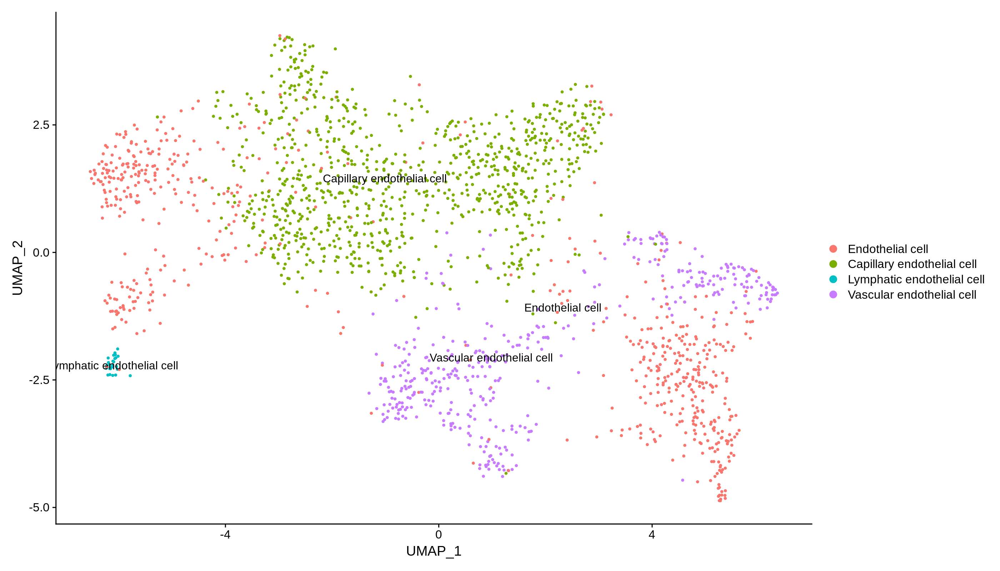

In [90]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj,reduction = "umap",label = T)

In [91]:
# save the subtypes
dataobj$sub.cell_type <- dataobj$cell_type
dataobj$sub.cell_type[colnames(dataobj) %in% colnames(subobj)] <- as.character(Idents(subobj))

### Reannotate Fibroblast

In [92]:
subobj <- subset(dataobj,cell_type =="Fibroblast")

In [93]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1605 features requested have not been scaled (running reduction without them): KCNA2, ZNF790, ZNF879, PYROXD2, BTBD19, ITGB8, MSANTD2, ARMCX5, ANKRD13B, SYT17, SLC22A15, NAT14, FUT4, ZNF140, RPP40, NACAD, TCF20, LRRC23, HOXD8, ZNF829, CROCCP3, OAS2, SHC4, WDFY3-AS2, ST6GALNAC3, HOXC4, PRIMA1, IDH1-AS1, ZFP3, ZNF35, DPH2, ZNF502, SMPD2, PPAN, ZXDB, AMIGO1, ZRANB3, PEX14, PEX12, DISP1, ZNRD1ASP, CFAP91, TTC8, SDR42E2, RAB33B, TCF19, PPP6R1, ZNF689, ZSCAN9, KLHL29, VAV3, SPAST, OTULINL, ZNF630, TRIM66, ZNF500, PRCD, MCM9, C1QTNF9, ZKSCAN3, NFKBIE, GFRA2, PARPBP, TBC1D10B, JAZF1, CDT1, CACNA2D4, SEC31B, BCAT1, IGDCC4, PLAAT1, PLGLB1, CMTR2, ERMARD, ASB14, PTOV1-AS1, PDK3, DNAJC3-DT, ZSCAN31, ANKRD10-IT1, GPC4, TMEM44, EFCAB11, C21orf58, MYO19, NRXN3, MZF1, ZNF391, C9orf64, SEC24C, RRNAD1, C14orf93, LINC00240, CYP7B1, RNF17, CUL7, NME5, ZNF607, ZNF496, ZNF70, ZNF676, HGF, VEPH1, EYS, HDX, LINC

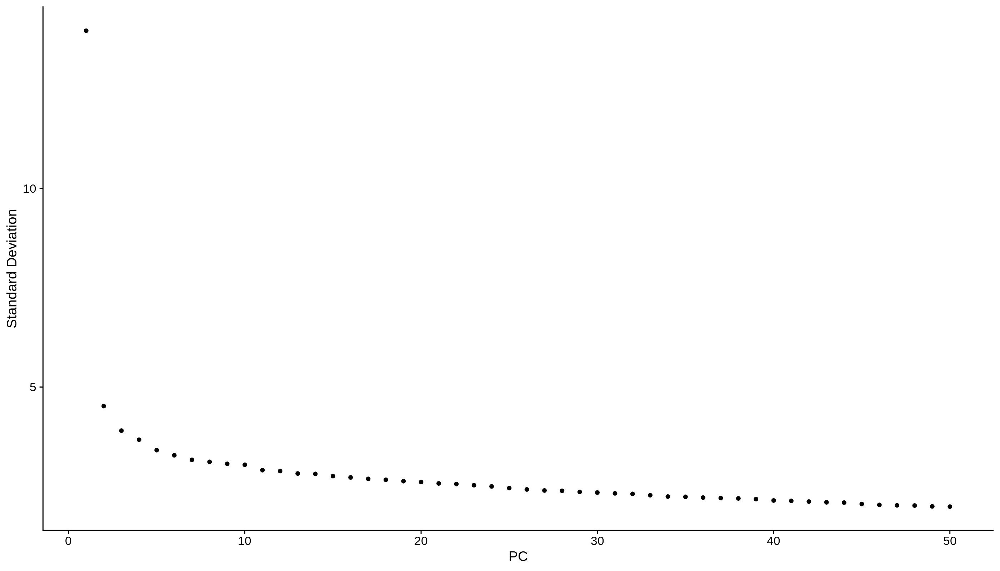

In [94]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))
ElbowPlot(subobj,ndims=50) 

In [95]:
pcDim = 10

In [96]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

18:55:23 UMAP embedding parameters a = 0.9922 b = 1.112

18:55:23 Read 405 rows and found 10 numeric columns

18:55:23 Using Annoy for neighbor search, n_neighbors = 30

18:55:23 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

18:55:23 Writing NN index file to temp file /tmp/RtmpgFw1Vx/file3eca573a2fdde9

18:55:23 Searching Annoy index using 1 thread, search_k = 3000

18:55:23 Annoy recall = 100%

18:55:23 Commencing smooth kNN distance calibration using 1 thread

18:55:24 Initializing from normalized Laplacian + noise

18:55:24 Commencing optimization for 500 epochs, with 16438 positive edges

18:55:24 Optimization finished



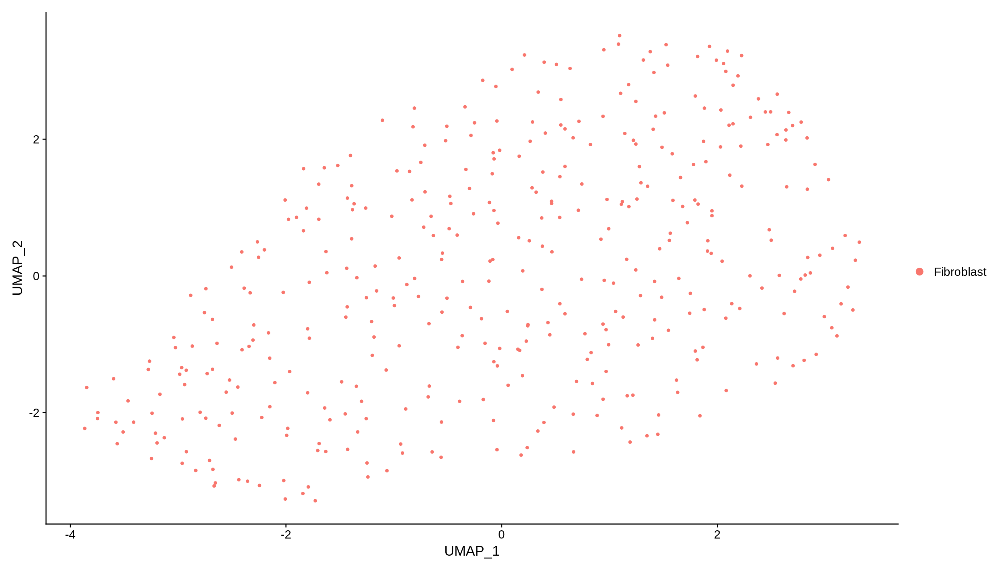

In [97]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj, reduction = "umap")

#### Myofibroblast

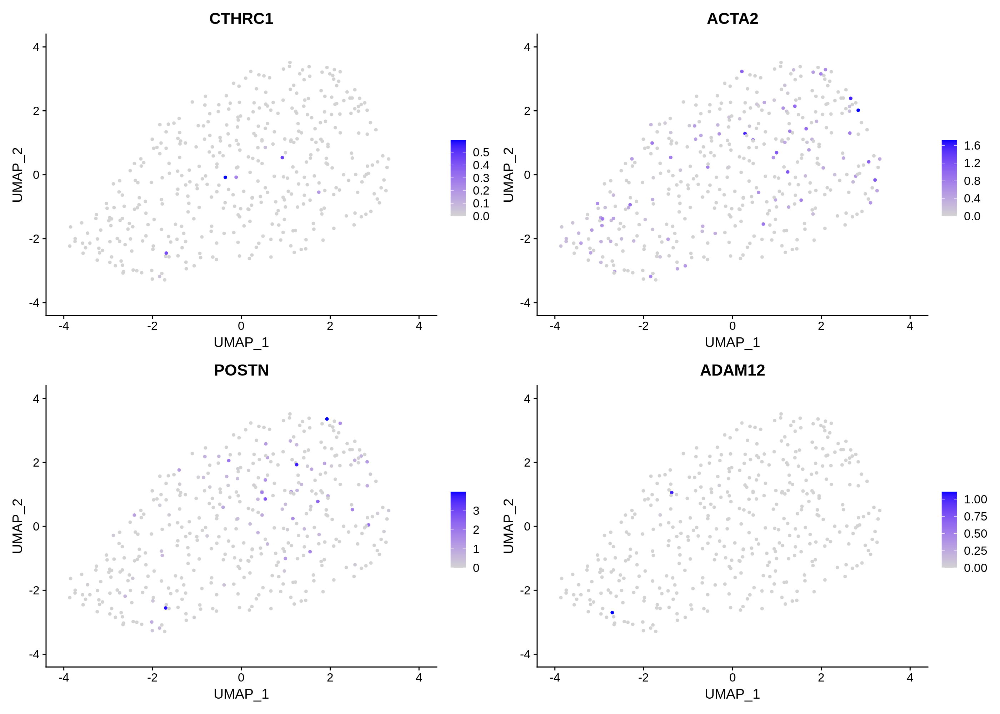

In [98]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("CTHRC1","ACTA2","POSTN","ADAM12"))


#### Fibrocyte

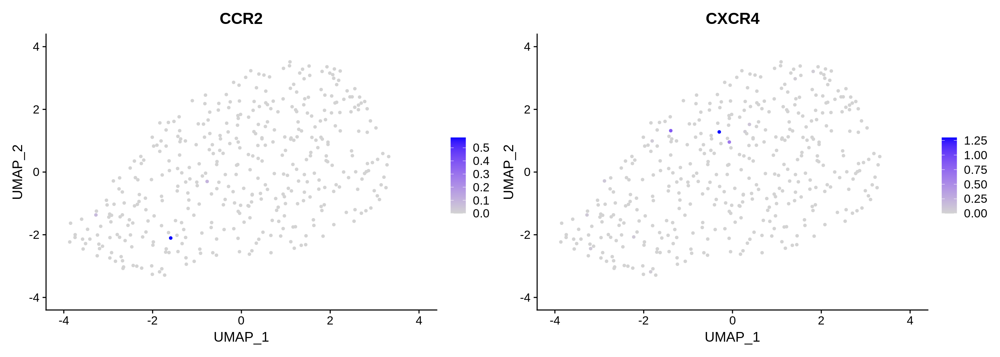

In [99]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
FeaturePlot(subobj,c("CCR2","CXCR4"))


#### Basement membrane fibroblast

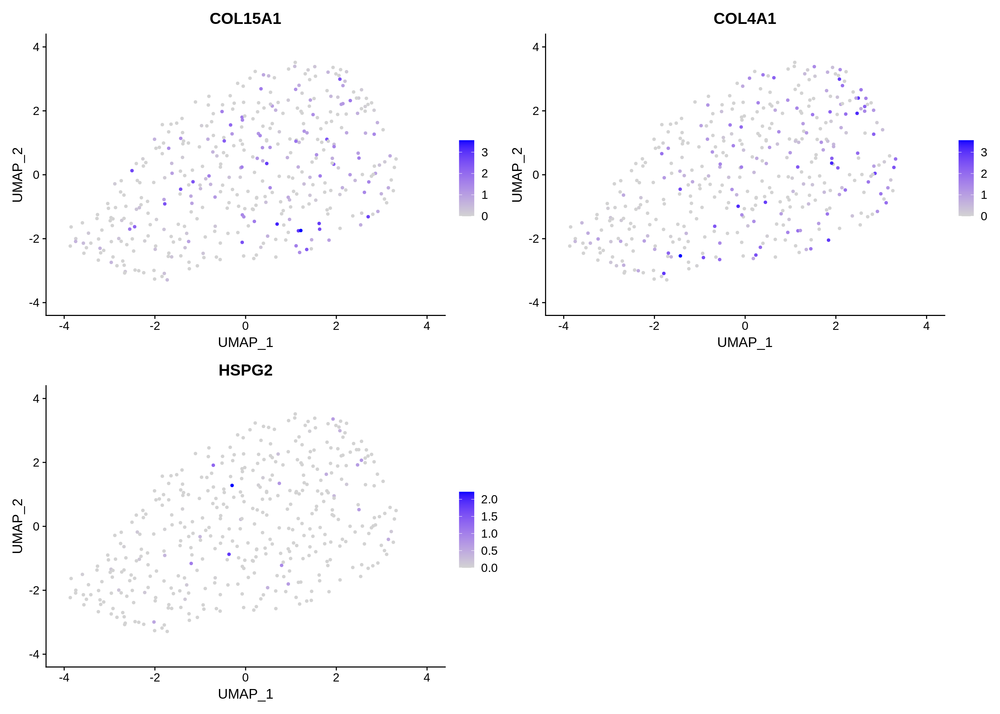

In [100]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("COL15A1","COL4A1","HSPG2"))


#### Adventitial fibroblast

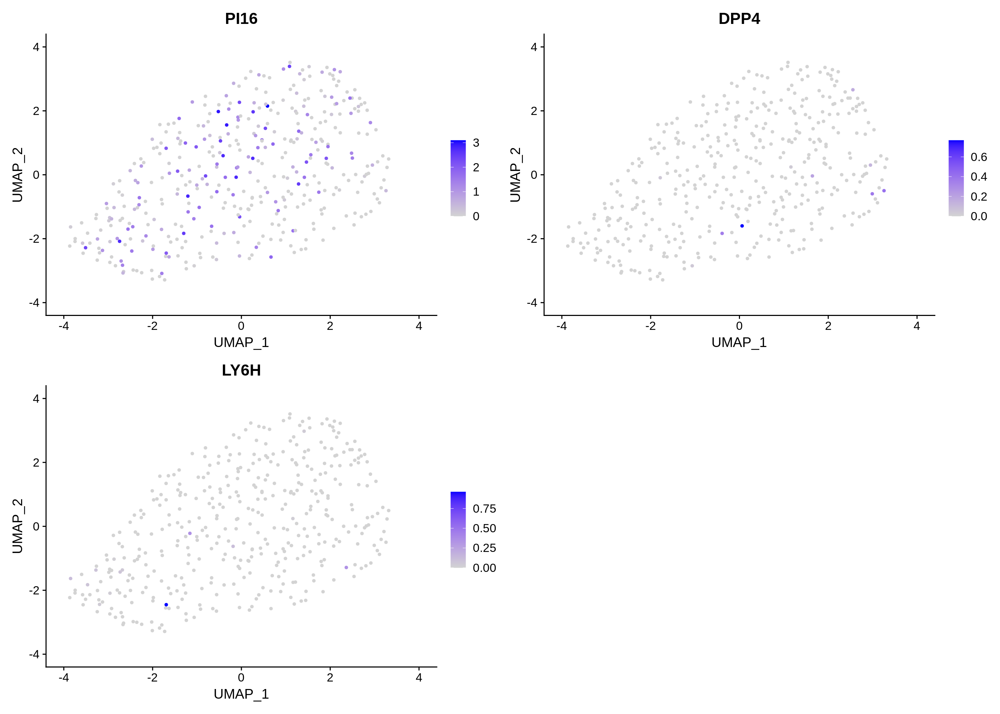

In [101]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("PI16","DPP4","LY6H"))


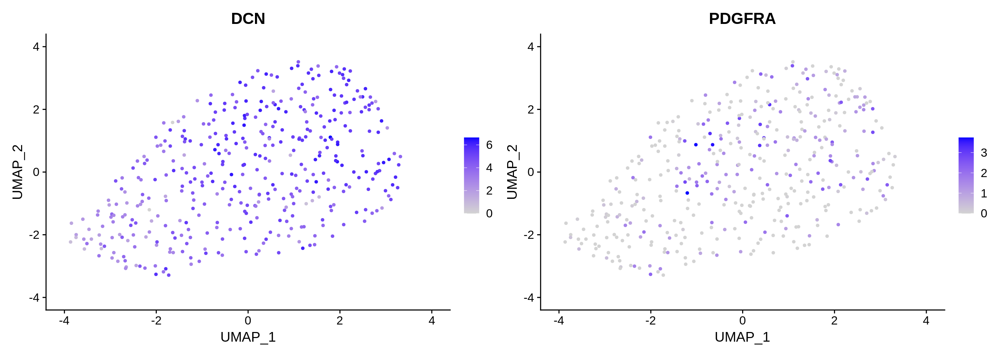

In [102]:
options(repr.plot.width=14, repr.plot.height=5*1, repr.plot.res = 200)
FeaturePlot(subobj,c("DCN","PDGFRA"))


分不出亚型

### Reannotate Myeloid cell

In [103]:
subobj <- subset(dataobj,cell_type =="Myeloid cell")

In [105]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1699 features requested have not been scaled (running reduction without them): TFCP2, XPO6, CXCL3, DGAT2, ZBED5-AS1, TGFA, EPS8L1, GCH1, ATG4A, ASPM, LINC01504, RGS2, TMEM214, HEATR6, HEY1, BANK1, AATBC, GAS2, UPB1, IFT46, PGBD4, APBB3, B4GALT4, CXCL8, ST18, HECTD2, PANX1, PBLD, CASKIN2, NATD1, CKMT2-AS1, PAQR6, ATP23, DDX59, CCDC125, P3H3, TOP2A, SLC30A6, OTUD4, CEP164, GNE, RSBN1, DLEU2, SFXN5, TEC, TKFC, C6orf226, MAP2K3, MICAL1, PCNX4, RDH13, PTPN14, SLC25A28, TNFSF15, ZNF213, FRMD8, RNF146, HEBP1, DCTN4, FAM122A, ZBTB34, MCMBP, BLZF1, NCK2, CTDP1, CPLANE1, SNORA28, PAXIP1-DT, NFRKB, LSM8, CASP9, TRIM11, RCBTB1, PRC1, GSPT2, C21orf58, FBXO8, TVP23C, THBS1, MBTPS2, RRP12, SPAG1, CCNE1, TMEM154, UHRF1, MCM4, RBSN, RNF113A, THAP12, CNNM4, ADHFE1, METTL15, RPA3, ITGA9, TPX2, GGA3, ELP6, SGTB, USP19, C19orf18, YEATS4, ABHD5, UBAP2, HEATR1, HEY2, NFIL3, NOM1, VIPAS39, KIAA0586, ESPL1, HSPH1

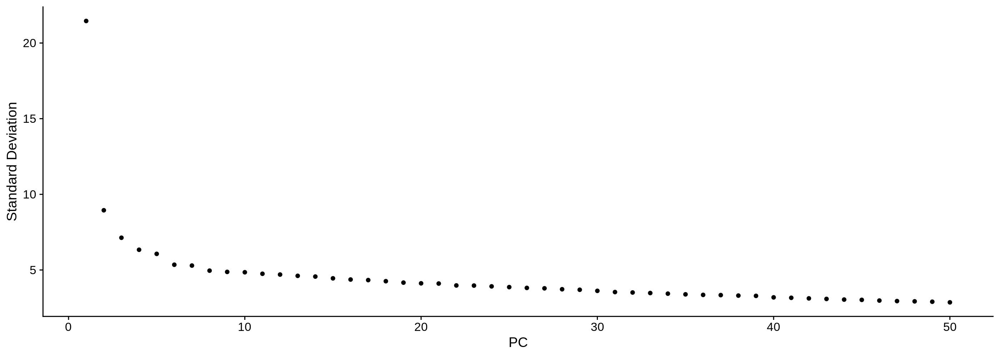

In [106]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))
ElbowPlot(subobj,ndims=50) 

In [107]:
pcDim = 20

In [108]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

19:00:27 UMAP embedding parameters a = 0.9922 b = 1.112

19:00:27 Read 151 rows and found 20 numeric columns

19:00:27 Using Annoy for neighbor search, n_neighbors = 30

19:00:27 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:00:27 Writing NN index file to temp file /tmp/RtmpgFw1Vx/file3eca5746f7dcde

19:00:27 Searching Annoy index using 1 thread, search_k = 3000

19:00:27 Annoy recall = 100%

19:00:27 Commencing smooth kNN distance calibration using 1 thread

19:00:28 Initializing from normalized Laplacian + noise

19:00:28 Commencing optimization for 500 epochs, with 5834 positive edges

19:00:28 Optimization finished



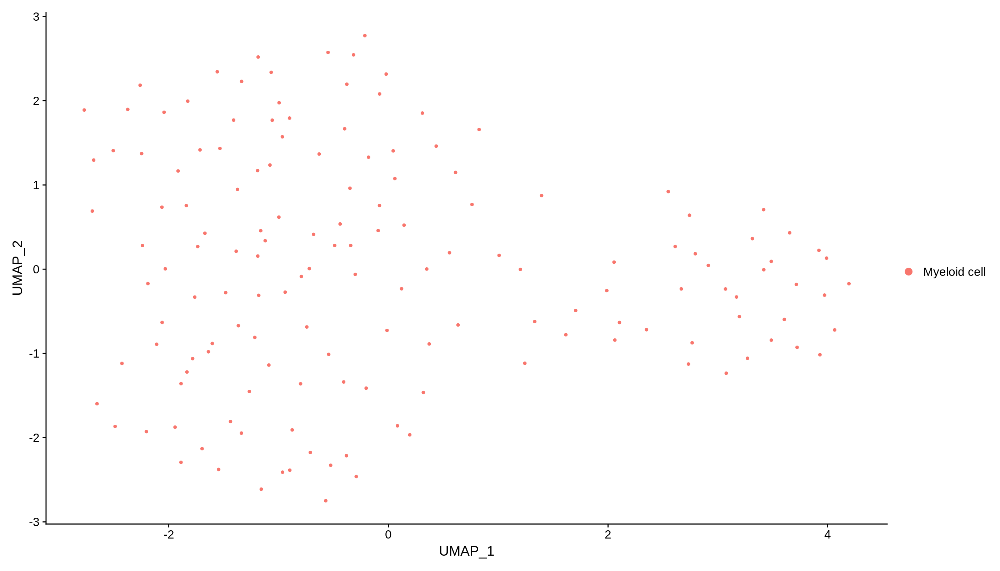

In [109]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj, reduction = "umap")

In [115]:
# Cluster the cells
subobj <- FindNeighbors(subobj, reduction = "pca", dims = 1:pcDim, nn.eps = 0.5)
subobj <- FindClusters(subobj, resolution = 0.8, n.start = 2)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 151
Number of edges: 5864

Running Louvain algorithm...
Maximum modularity in 2 random starts: 0.4437
Number of communities: 3
Elapsed time: 0 seconds


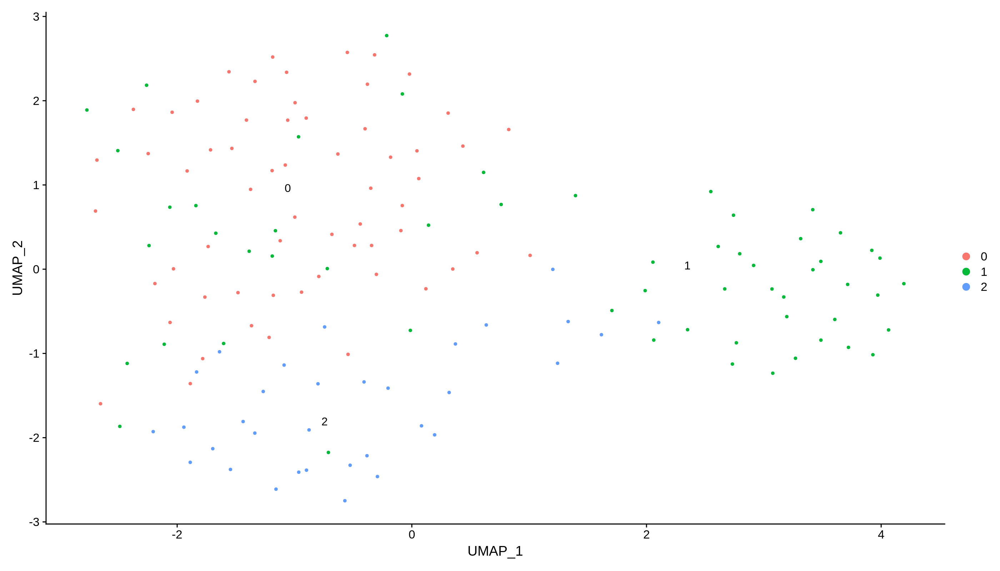

In [116]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj,reduction = "umap",label = T)

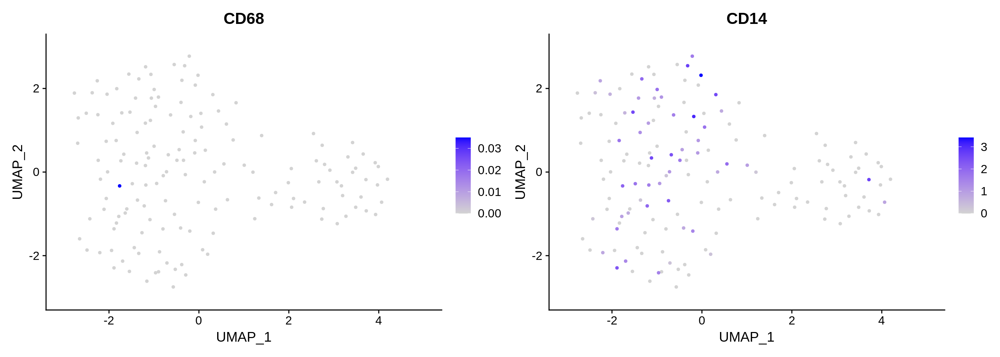

In [117]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("CD68","CD14"))

#### Neutrophilic granulocyte

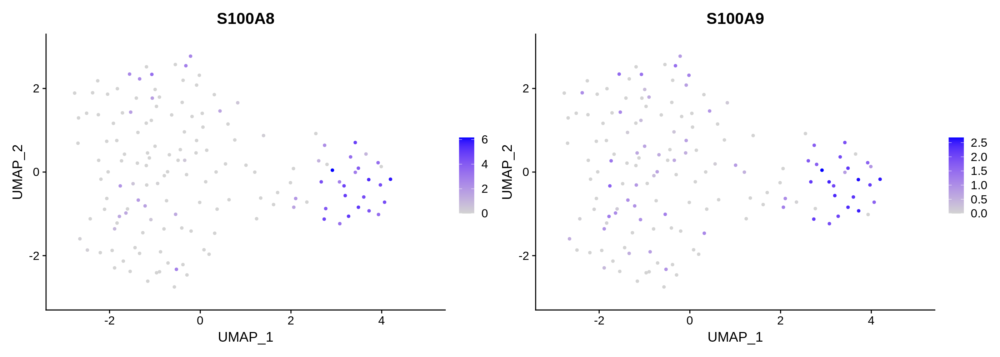

In [118]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("S100A8","S100A9"))


In [119]:
subobj <- RenameIdents(object = subobj,'1' = 'Neutrophilic granulocyte')

#### Mast cell

Warning message in FeaturePlot(subobj, c("MS4A2", "CPA3", "TPSAB1")):
“All cells have the same value (0) of CPA3.”
Warning message in FeaturePlot(subobj, c("MS4A2", "CPA3", "TPSAB1")):
“All cells have the same value (0) of TPSAB1.”


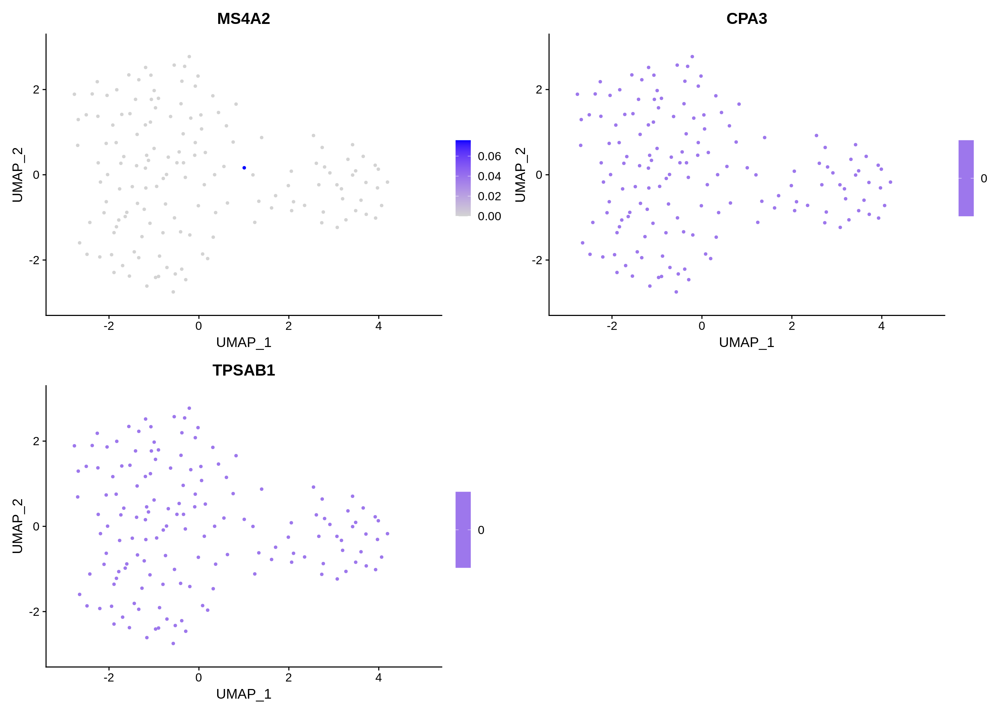

In [120]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("MS4A2","CPA3","TPSAB1"))


### Dendritic cell

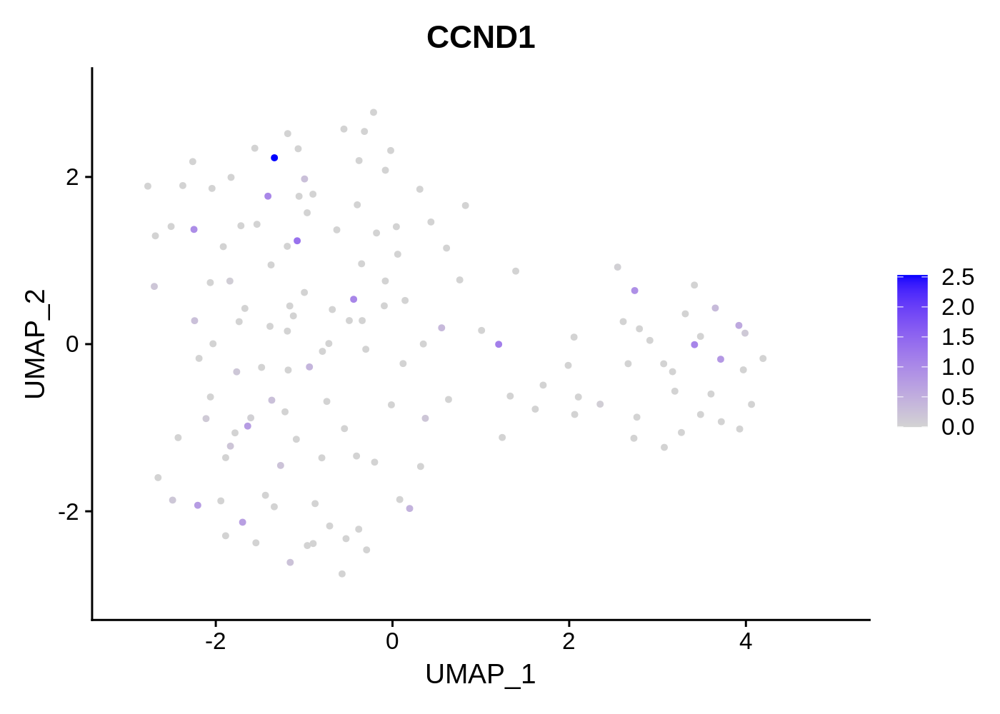

In [122]:
options(repr.plot.width=7, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("CCND1"))


### Monocyte

Warning message in FeaturePlot(subobj, c("CD14", "FCGR3A", "PLAC8")):
“All cells have the same value (0) of PLAC8.”


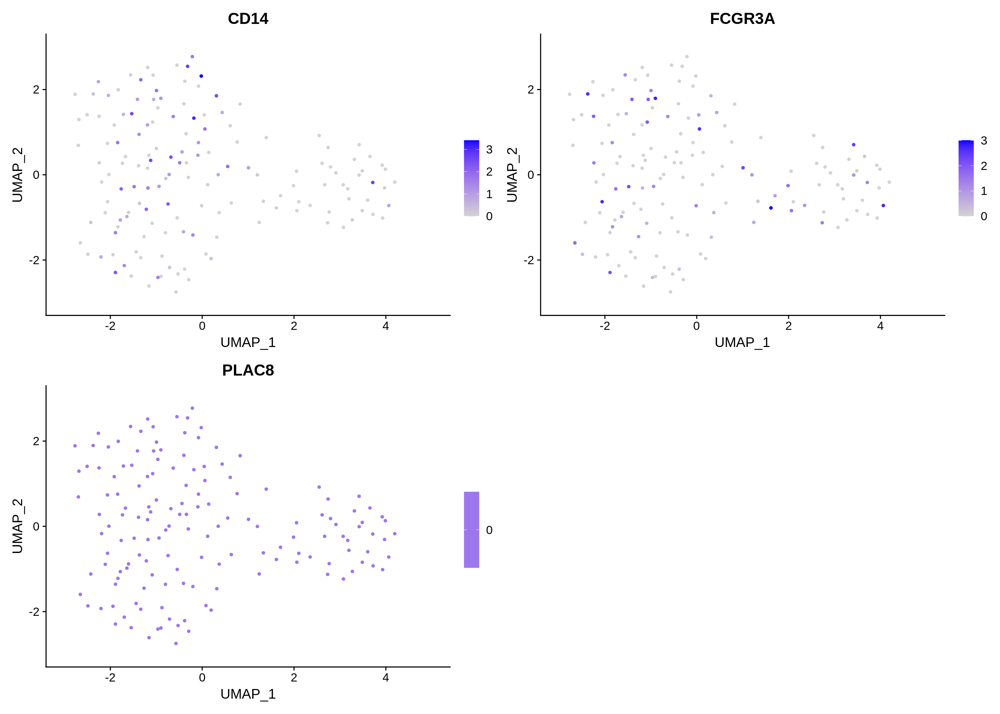

In [123]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("CD14","FCGR3A","PLAC8"))


Warning message in FeaturePlot(subobj, c("PLAC8", "MSR1", "MRC1")):
“All cells have the same value (0) of PLAC8.”


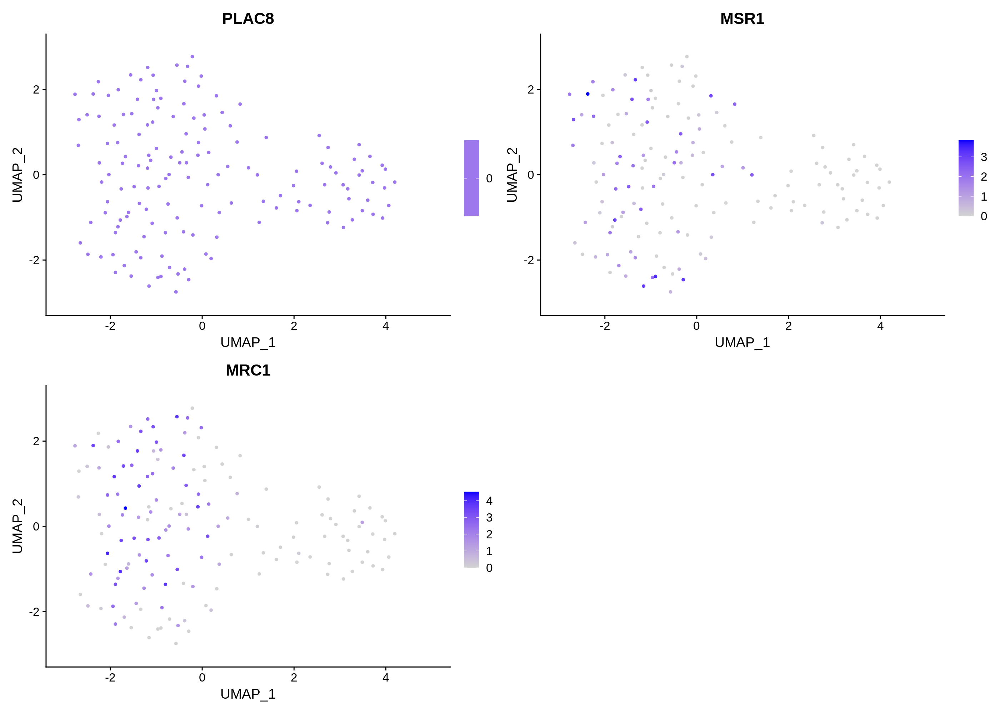

In [124]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("PLAC8","MSR1","MRC1"))


In [125]:
subobj <- RenameIdents(object = subobj,'0' = 'Macrophage','2'='Macrophage')

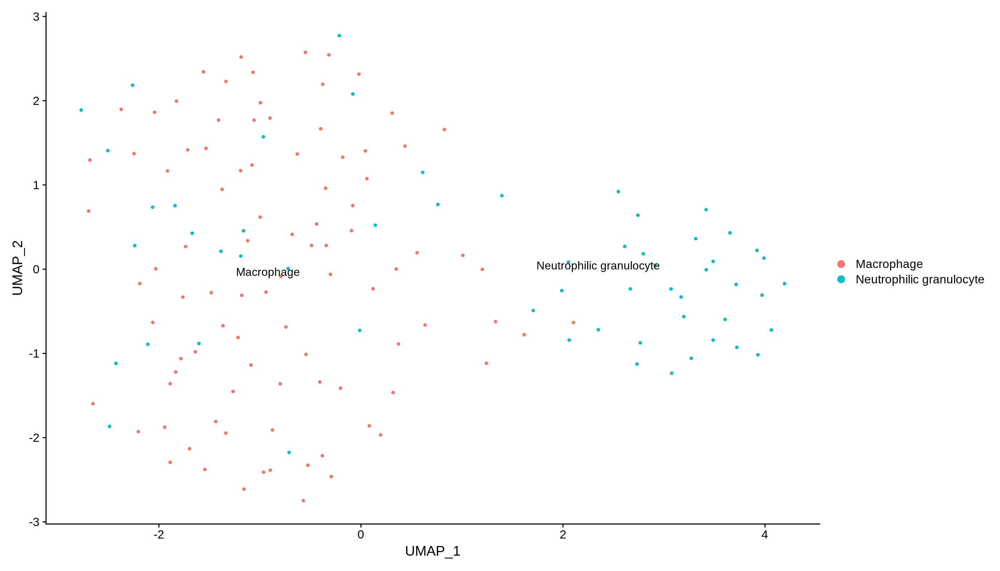

In [126]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj,reduction = "umap",label = T)

In [127]:
# save the subtypes
dataobj$sub.cell_type[colnames(dataobj) %in% colnames(subobj)] <- as.character(Idents(subobj))

In [129]:
subobj <- subset(dataobj,sub.cell_type =="Macrophage")

In [130]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1774 features requested have not been scaled (running reduction without them): CXCL3, CXCL8, RGS2, MICAL1, B4GALT4, THBS1, AEBP1, HEATR6, IFT46, ATG4A, CASP9, APBB3, KIAA0586, HEY1, HSPH1, CKMT2-AS1, MCM4, SOD2, USPL1, RDH13, DDX59, PRRC1, DDX3Y, BANK1, RBSN, STARD8, VIPAS39, ST18, SPAG1, NFRKB, PANX1, AREG, TFCP2, GPATCH4, SLC30A6, PPP1R9A, GGA3, ZBED5-AS1, EPS8L1, H4C14, ITGB3BP, SFXN5, SUGP1, TVP23C, TEC, PAQR6, CNNM4, CASP8, CPLANE1, ZMYM1, FAM229A, SRPRB, NUP43, PPCDC, ZNF213, ELP6, SNORA28, RCBTB1, PHF7, CKS2, ABRAXAS2, POLR3A, CCDC93, CENPE, POLR2H, RNF113A, MYCBP, TNFSF15, CR1, CNIH1, FOXJ3, FBXO8, TTF2, RABEPK, ZBTB34, CD300E, C1orf131, PREP, ACVR2A, FOS, YTHDF3-AS1, MED23, FZD1, ILKAP, FAM114A2, MTX2, TPX2, NAA35, YDJC, POLM, NUP98, AIDA, SMC6, EIF2B5, UHRF1BP1, LGALS1, CSNK1G1, RETSAT, ZNF404, METTL15, MSH2, C6orf226, ALDH9A1, SMAP1, ZNF812P, CHCHD6, ACACA, ARF4-AS1, PLIN2, MIC

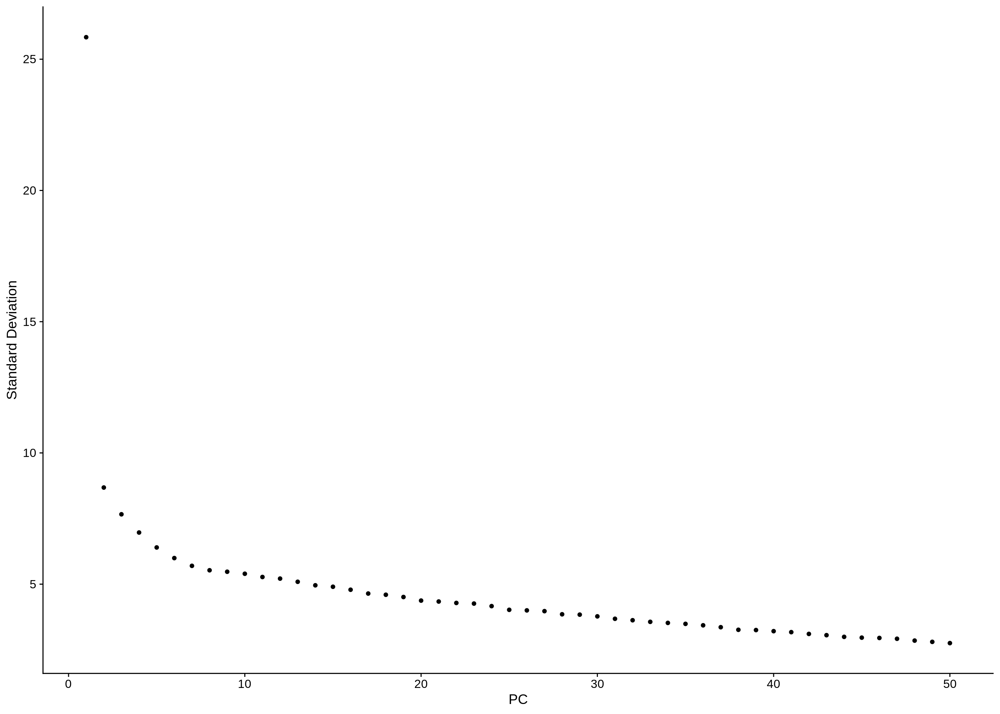

In [131]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))
ElbowPlot(subobj,ndims=50) 

In [132]:
pcDim = 30

In [133]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)

19:07:44 UMAP embedding parameters a = 0.9922 b = 1.112

19:07:44 Read 94 rows and found 30 numeric columns

19:07:44 Using Annoy for neighbor search, n_neighbors = 30

19:07:44 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:07:44 Writing NN index file to temp file /tmp/RtmpgFw1Vx/file3eca575fa29aef

19:07:44 Searching Annoy index using 1 thread, search_k = 3000

19:07:44 Annoy recall = 100%

19:07:45 Commencing smooth kNN distance calibration using 1 thread

19:07:45 Initializing from normalized Laplacian + noise

19:07:45 Commencing optimization for 500 epochs, with 3546 positive edges

19:07:46 Optimization finished



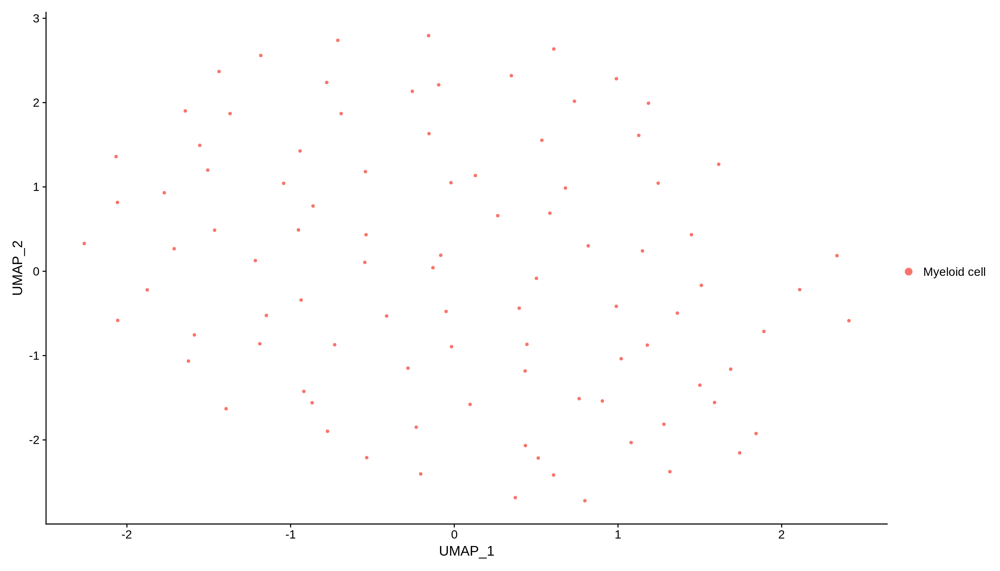

In [134]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj, reduction = "umap")

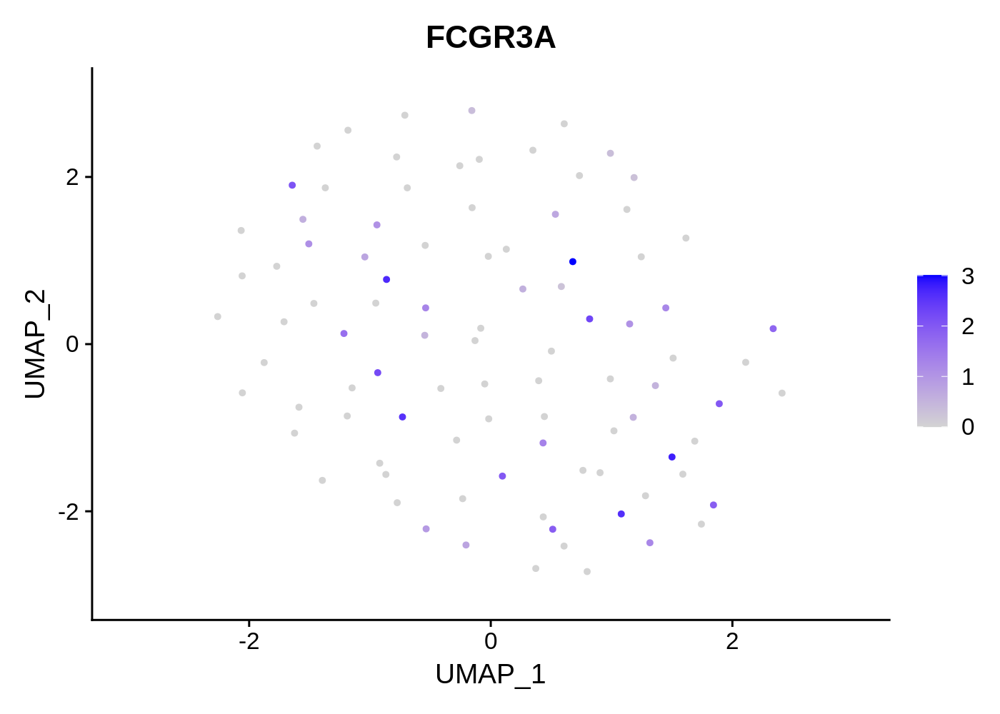

In [135]:
options(repr.plot.width=7, repr.plot.height=5*1, repr.plot.res = 200)
FeaturePlot(subobj,c("FCGR3A"))

Warning message in FeaturePlot(subobj, c("PLAC8", "MSR1", "MRC1")):
“All cells have the same value (0) of PLAC8.”


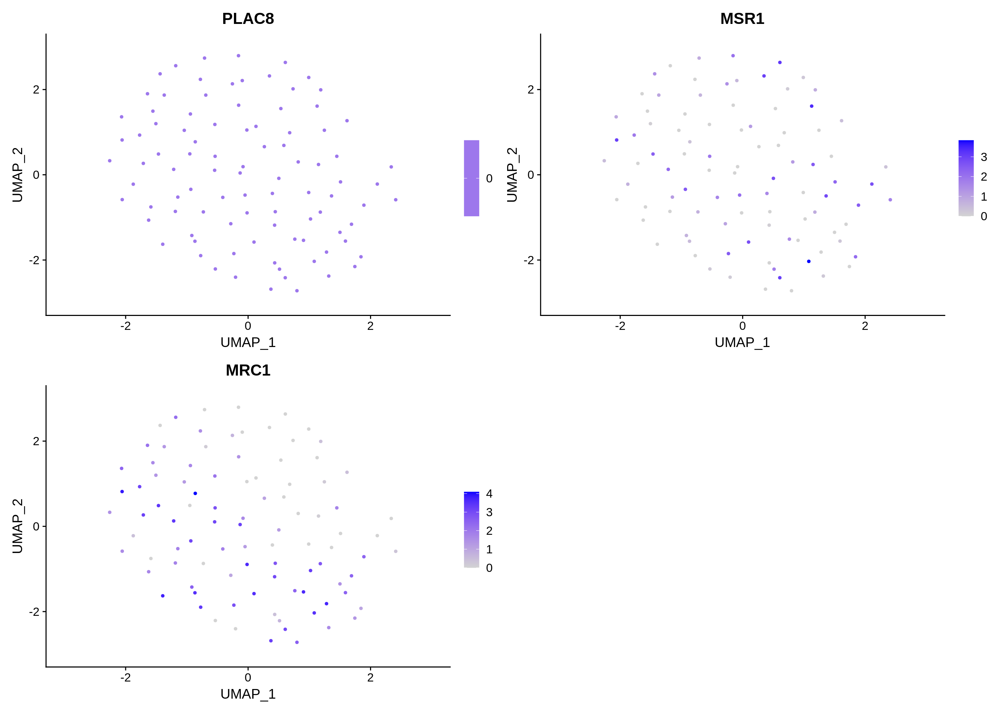

In [136]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("PLAC8","MSR1","MRC1"))

### Reannotate Lymphoid cell

In [137]:
subobj <- subset(dataobj,cell_type =="Lymphoid cell")

In [138]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1782 features requested have not been scaled (running reduction without them): HSP90AA1, HSPA1A, LACTB2, MYCBP, ZNF600, ARL13B, MDC1, BLOC1S2, SETDB1, SUCO, ACTR6, CCDC61, STAMBPL1, LONRF3, MAP2K1, PHF19, EIF4HP1, RNMT, PAG1, KDM1B, FRMD4B, RING1, TNIK, HAUS2, PDRG1, CCDC59, MLH1, ZNF75A, PIK3R5, HSP90AB1, PPP2R2B, WDR5, AHCTF1, CDR2, RBM7, CSNK1G1, USP24, REST, EXOC4, MCTP1, EMC1, RPS14, BBS7, LYPLA2, ZBTB40, SNIP1, GEMIN8, CBL, CPED1, SLF1, ACTL6A, ARNT, MMGT1, SLC30A6, RGS2, TTC38, PARP11, PHAX, ZNF808, COMMD10, FHOD1, NEK3, TRANK1, ZZEF1, MDM1, LINC00909, IFT88, WDR54, RP9P, LSM6, GRK6, METTL5, MAGOHB, HSPA1B, POLR2K, QRSL1, KIAA0040, PTPRN2, LONP2, ZNF12, BRWD1, PRKY, HSPA2, MICU1, RAB37, POLR2C, HHEX, C2CD3, FAR1, ERCC8, MAML2, DNAJA1, TMCO4, RPS6, ZNF296, KRR1, SNHG3, NCBP1, ZNF549, RPS19, GOSR1, SYTL3, ZNF644, TMTC3, EMC9, ICE2, TTPAL, GUF1, ANO6, ZNF718, OXR1, BUB3, KIAA0100, H1-

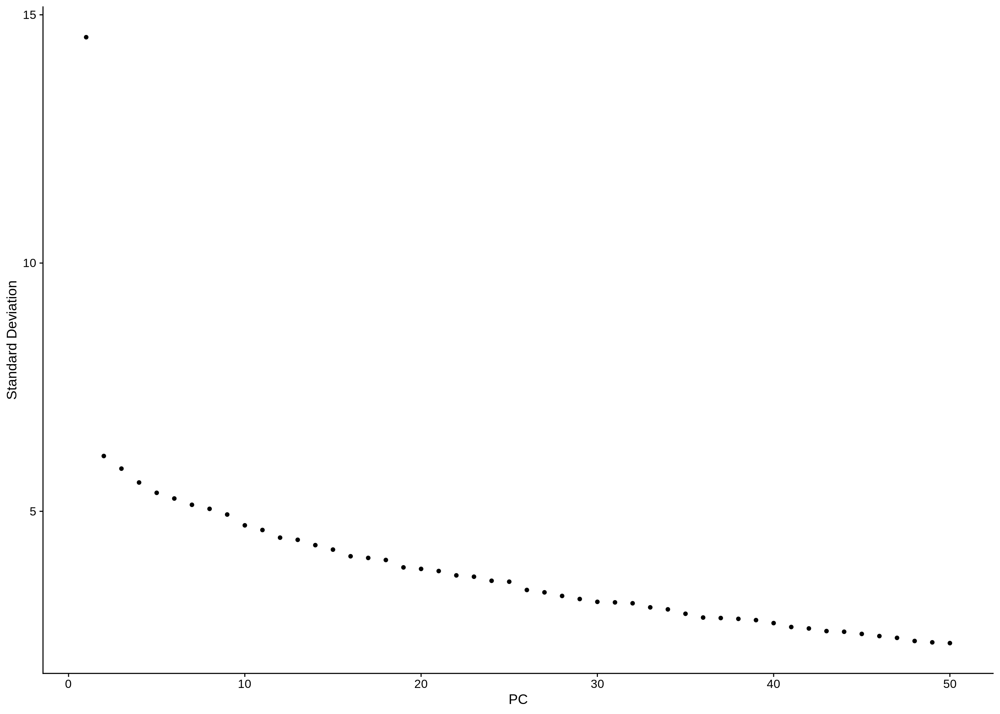

In [139]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))
ElbowPlot(subobj,ndims=50) 

In [140]:
pcDim = 30

In [141]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

19:08:18 UMAP embedding parameters a = 0.9922 b = 1.112

19:08:18 Read 114 rows and found 30 numeric columns

19:08:18 Using Annoy for neighbor search, n_neighbors = 30

19:08:18 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:08:18 Writing NN index file to temp file /tmp/RtmpgFw1Vx/file3eca57226a3f5b

19:08:18 Searching Annoy index using 1 thread, search_k = 3000

19:08:18 Annoy recall = 100%

19:08:18 Commencing smooth kNN distance calibration using 1 thread

19:08:19 Initializing from normalized Laplacian + noise

19:08:19 Commencing optimization for 500 epochs, with 4114 positive edges

19:08:19 Optimization finished



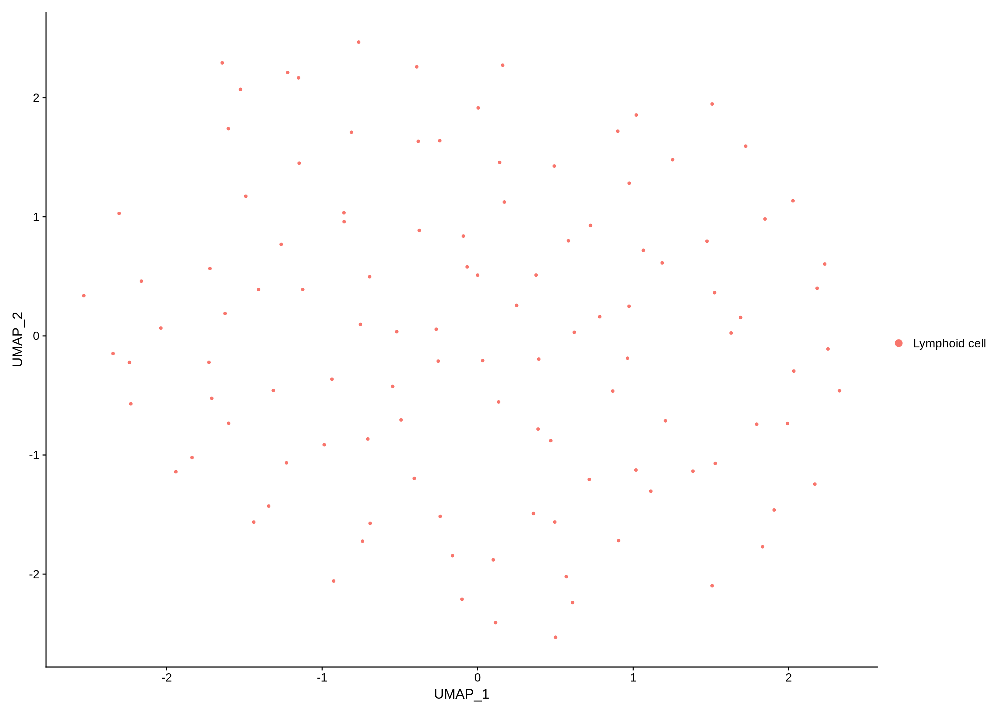

In [142]:
DimPlot(subobj, reduction = "umap")

In [147]:
# Cluster the cells
subobj <- FindNeighbors(subobj, reduction = "pca", dims = 1:pcDim, nn.eps = 0.5)
subobj <- FindClusters(subobj, resolution = 1, n.start = 2)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 114
Number of edges: 6230

Running Louvain algorithm...
Maximum modularity in 2 random starts: 0.0586
Number of communities: 3
Elapsed time: 0 seconds


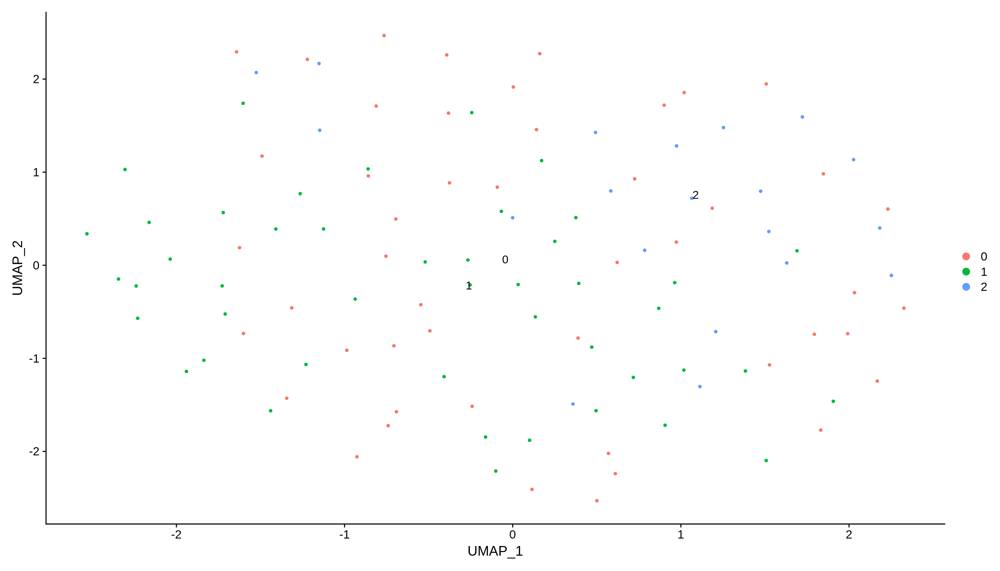

In [148]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(subobj,reduction = "umap",label = T)

Warning message in FeaturePlot(subobj, c("CD79A", "CD24")):
“All cells have the same value (0) of CD79A.”


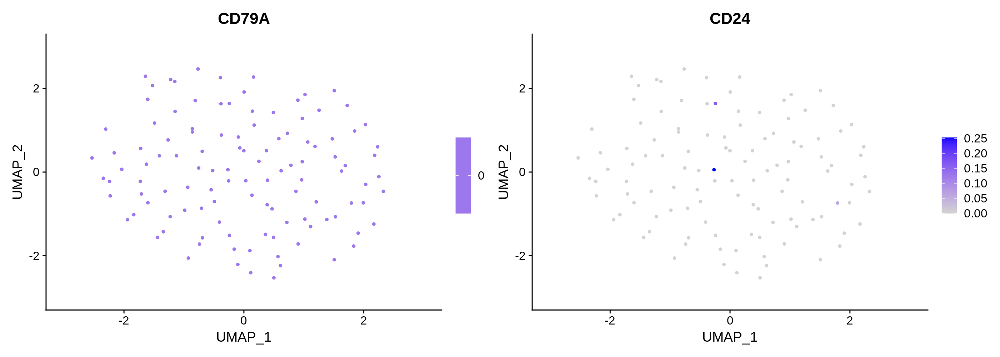

In [149]:
options(repr.plot.width=14, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("CD79A","CD24"))

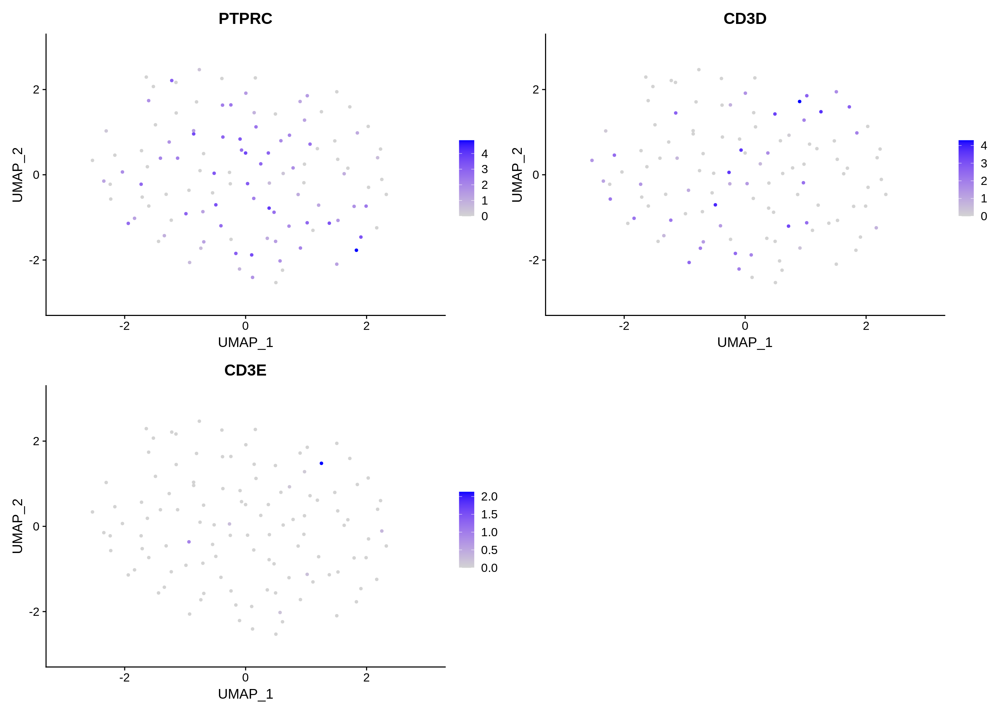

In [150]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("PTPRC","CD3D","CD3E"))

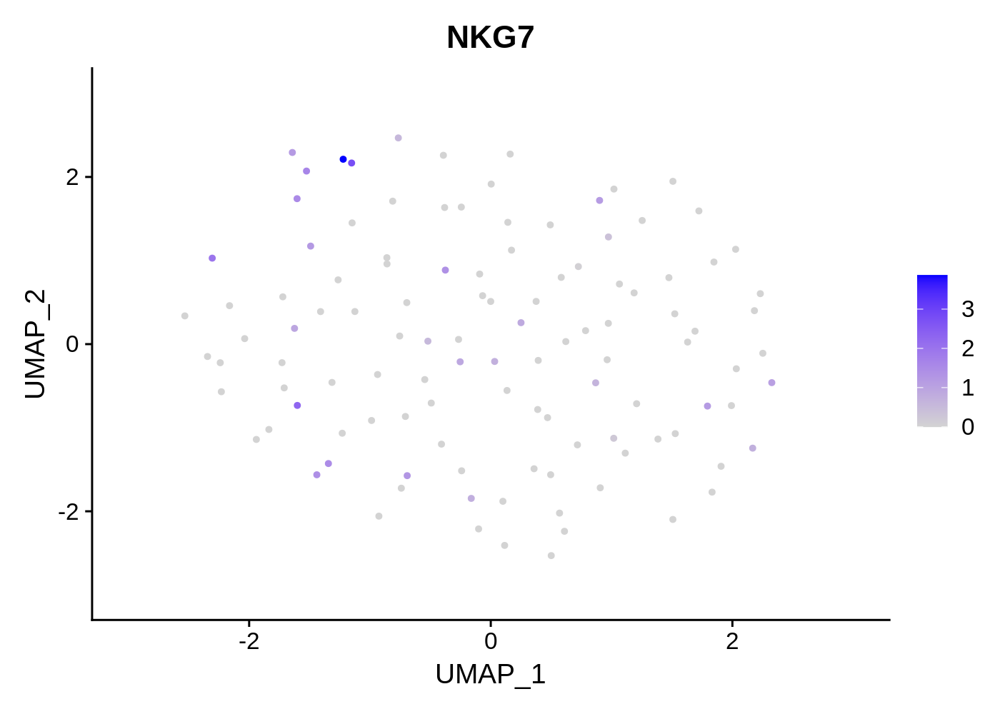

In [151]:
options(repr.plot.width=7, repr.plot.height=5, repr.plot.res = 200)
FeaturePlot(subobj,c("NKG7"))

In [152]:
# save the subtypes
dataobj$sub.cell_type[colnames(dataobj) %in% colnames(subobj)] <- "T cell"

In [153]:
subobj <- subset(dataobj,sub.cell_type =="T cell")

In [154]:
subobj <- FindVariableFeatures(subobj)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”


Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1782 features requested have not been scaled (running reduction without them): HSP90AA1, HSPA1A, LACTB2, MYCBP, ZNF600, ARL13B, MDC1, BLOC1S2, SETDB1, SUCO, ACTR6, CCDC61, STAMBPL1, LONRF3, MAP2K1, PHF19, EIF4HP1, RNMT, PAG1, KDM1B, FRMD4B, RING1, TNIK, HAUS2, PDRG1, CCDC59, MLH1, ZNF75A, PIK3R5, HSP90AB1, PPP2R2B, WDR5, AHCTF1, CDR2, RBM7, CSNK1G1, USP24, REST, EXOC4, MCTP1, EMC1, RPS14, BBS7, LYPLA2, ZBTB40, SNIP1, GEMIN8, CBL, CPED1, SLF1, ACTL6A, ARNT, MMGT1, SLC30A6, RGS2, TTC38, PARP11, PHAX, ZNF808, COMMD10, FHOD1, NEK3, TRANK1, ZZEF1, MDM1, LINC00909, IFT88, WDR54, RP9P, LSM6, GRK6, METTL5, MAGOHB, HSPA1B, POLR2K, QRSL1, KIAA0040, PTPRN2, LONP2, ZNF12, BRWD1, PRKY, HSPA2, MICU1, RAB37, POLR2C, HHEX, C2CD3, FAR1, ERCC8, MAML2, DNAJA1, TMCO4, RPS6, ZNF296, KRR1, SNHG3, NCBP1, ZNF549, RPS19, GOSR1, SYTL3, ZNF644, TMTC3, EMC9, ICE2, TTPAL, GUF1, ANO6, ZNF718, OXR1, BUB3, KIAA0100, H1-

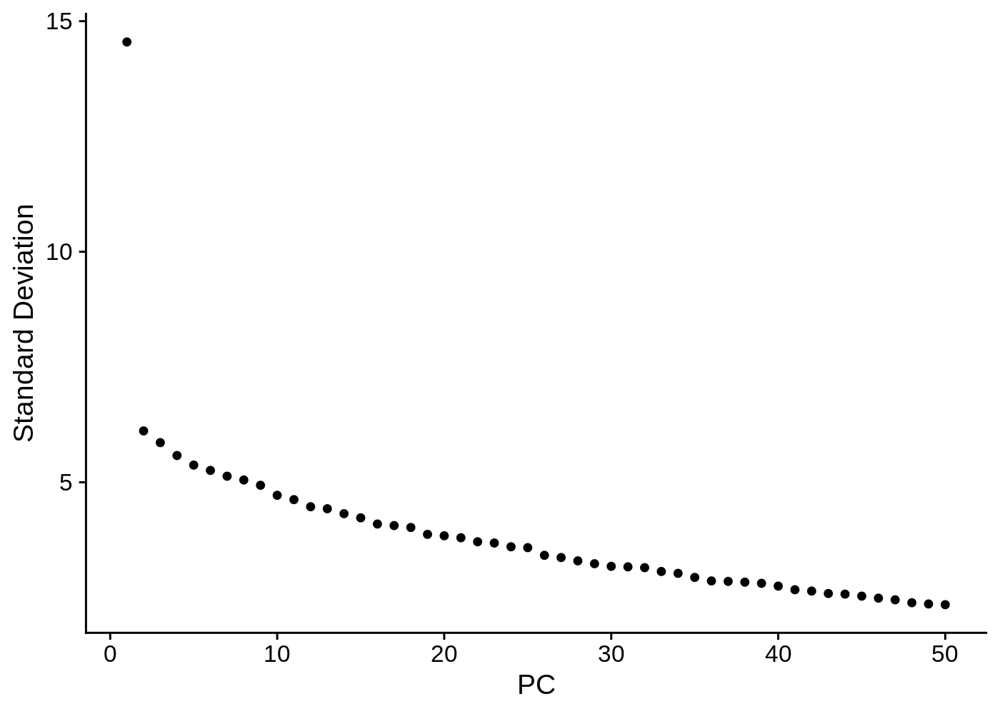

In [155]:
subobj <- RunPCA(subobj, features = VariableFeatures(object = subobj))
ElbowPlot(subobj,ndims=50) 

In [156]:
pcDim = 30

In [157]:
subobj <- RunUMAP(subobj, dims = 1:pcDim)
p_umap <- DimPlot(subobj, reduction = "umap", label = TRUE, pt.size=1)

19:09:45 UMAP embedding parameters a = 0.9922 b = 1.112

19:09:45 Read 114 rows and found 30 numeric columns

19:09:45 Using Annoy for neighbor search, n_neighbors = 30

19:09:45 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:09:45 Writing NN index file to temp file /tmp/RtmpgFw1Vx/file3eca574b0a8baf

19:09:45 Searching Annoy index using 1 thread, search_k = 3000

19:09:45 Annoy recall = 100%

19:09:46 Commencing smooth kNN distance calibration using 1 thread

19:09:46 Initializing from normalized Laplacian + noise

19:09:46 Commencing optimization for 500 epochs, with 4114 positive edges

19:09:46 Optimization finished



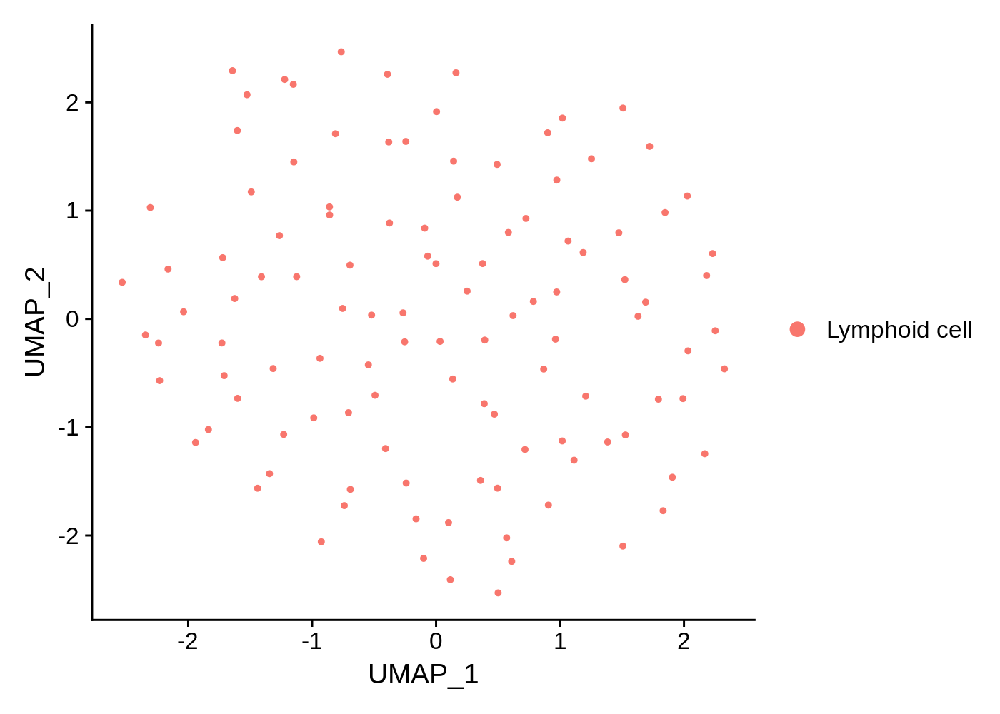

In [158]:
DimPlot(subobj, reduction = "umap")

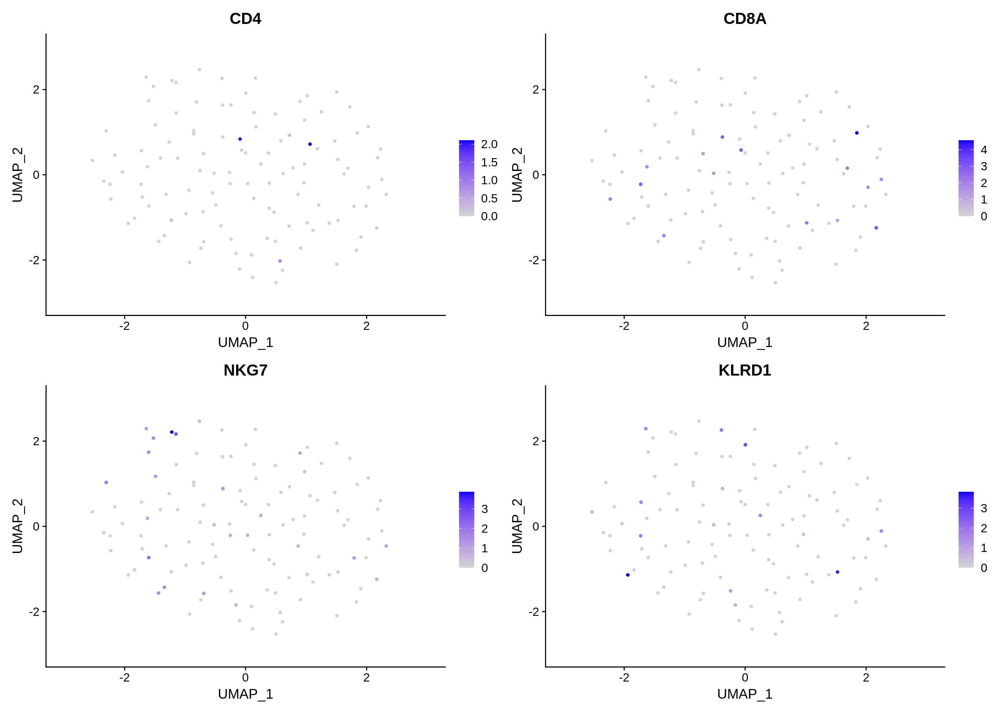

In [159]:
options(repr.plot.width=14, repr.plot.height=5*2, repr.plot.res = 200)
FeaturePlot(subobj,c("CD4","CD8A","NKG7","KLRD1"))

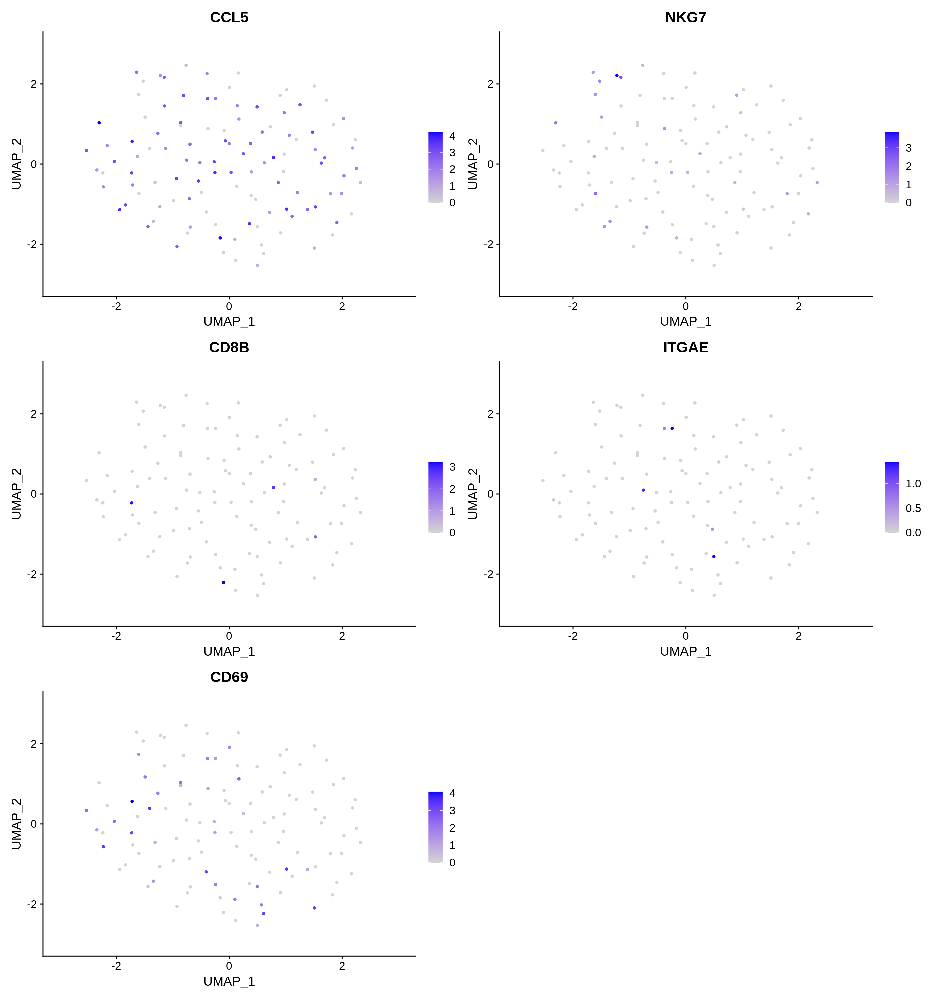

In [160]:
options(repr.plot.width=14, repr.plot.height=5*3, repr.plot.res = 200)
FeaturePlot(subobj,c("CCL5","NKG7","CD8B","ITGAE","CD69"))

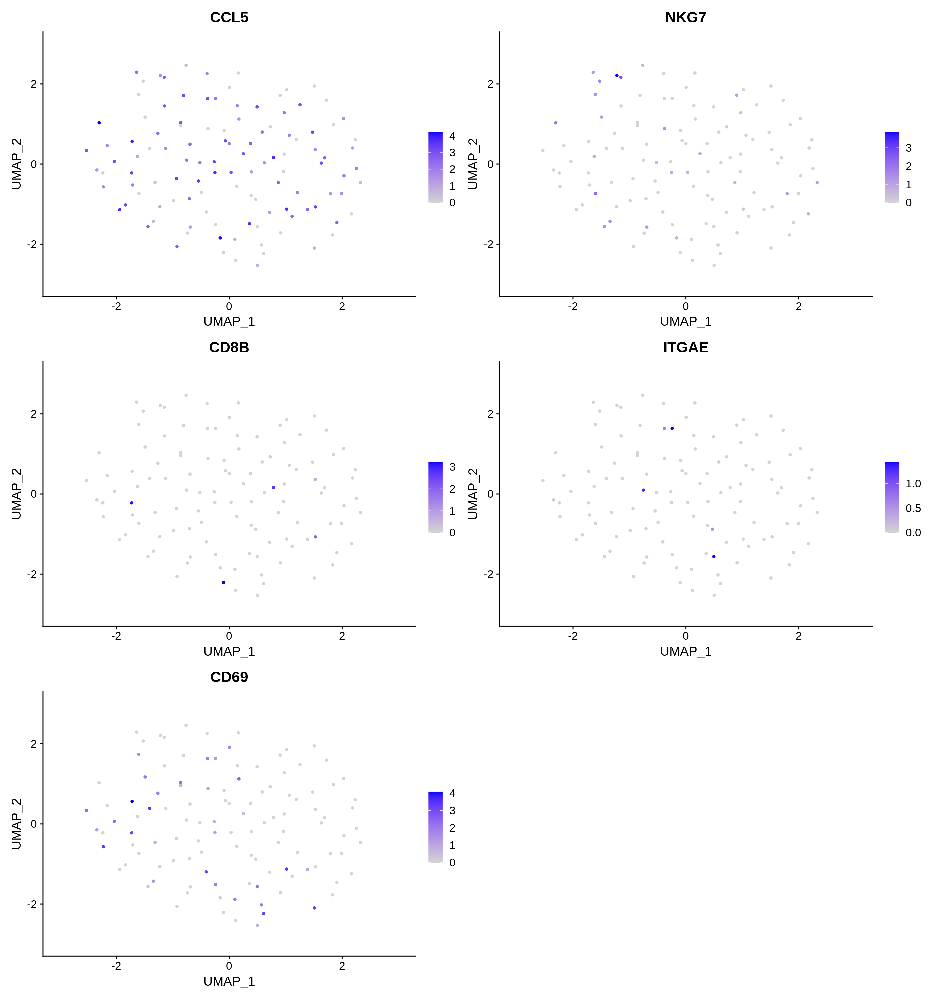

In [161]:
options(repr.plot.width=14, repr.plot.height=5*3, repr.plot.res = 200)
FeaturePlot(subobj,c("CCL5","NKG7","CD8B","ITGAE","CD69"))

# Recheck all

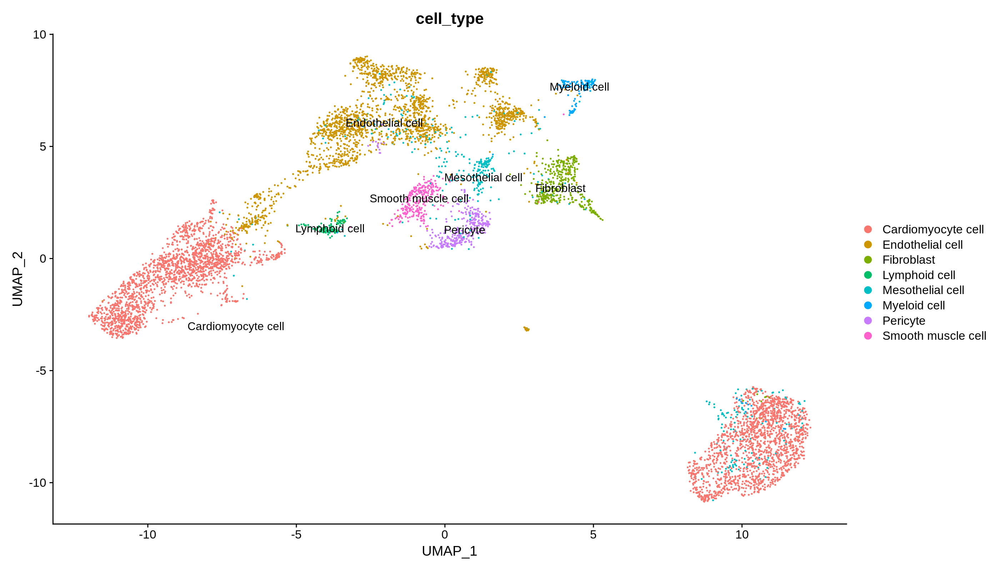

In [167]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(dataobj,reduction = "umap",group.by = "cell_type",label = T)

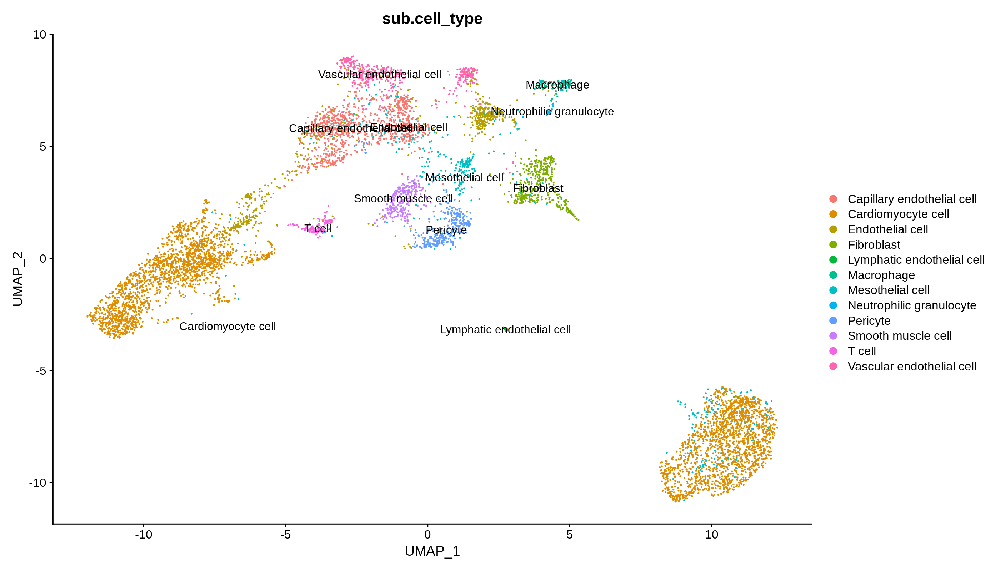

In [162]:
options(repr.plot.width=14, repr.plot.height=8, repr.plot.res = 200)
DimPlot(dataobj,reduction = "umap",group.by = "sub.cell_type",label = T)

# reorganize metadata

In [163]:
colnames(dataobj@meta.data)

[1] "study_doi"           "barcode"             "structural unit"    
 [4] "sub structural unit" "seq_tech"            "development_stage"  
 [7] "donor_id"            "donor_gender"        "donor_age"          
[10] "cell_type"           "RNA_snn_res.0.8"     "seurat_clusters"    
[13] "sub.cell_type"

In [165]:
dataobj@meta.data <- dataobj@meta.data[,c('study_doi','barcode','structural unit','sub structural unit','seq_tech','development_stage','donor_id','donor_gender','donor_age','cell_type','sub.cell_type')]

In [166]:
saveRDS(dataobj,"/data1/chenyx/Compitition/processed/Wang.rds")

# reorganize metadata for database

In [11]:
dataobj <- readRDS("/data1/chenyx/Compitition/processed/Wang.rds")

In [12]:
dataobj

An object of class Seurat 
43878 features across 7231 samples within 1 assay 
Active assay: RNA (43878 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

In [13]:
colnames(dataobj@meta.data) <- c("Ref","cell_ID","region","subregion","seq_tech","develop_stage","donor_ID","donor_gender","donor_age","MCT","cell_type")

In [16]:
dataobj@meta.data$organ <- "Heart"
dataobj@meta.data$sample_status <- "Healthy"
dataobj@meta.data$donor_status <- "Healthy"
dataobj@meta.data$seq_tech <- "SMART-seq"
dataobj@meta.data$treatment <- "None"
dataobj@meta.data$ethnicity <- "Asian"
dataobj@meta.data$if_patient <- "No"

In [22]:
saveRDS(dataobj, "/data1/chenyx/Compitition/processed/Wang.rds")